In [1]:
!pip install ripser
!pip install persim

In [0]:
import pandas as pd
import numpy as np
from ripser import ripser
from sklearn import preprocessing
from sklearn.cluster import *
from sklearn.manifold import *
from sklearn.cluster import *
import seaborn as sns
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import GridSearchCV
from sklearn.mixture import GaussianMixture as GMM
from sklearn.mixture import BayesianGaussianMixture
import itertools
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.neighbors import KernelDensity
from persim import plot_diagrams
from scipy import stats
from ripser import Rips

In [0]:
df = pd.read_csv(r'weather.csv')


In [0]:
df = df[['Date/Time','Temp (°C)','Rel Hum (%)','Stn Press (kPa)']].copy()



In [0]:

df.set_index('Date/Time', inplace=True)



In [6]:
df.shape

(744, 3)

In [7]:
color  = ['1','2','3','4','5']

C = np.repeat(color,168)
WEEK = C[:744]
len(WEEK)



744

In [8]:
df['WEEK'] = WEEK
df

,Temp (°C),Rel Hum (%),Stn Press (kPa),WEEK
Date/Time,,,,
2018-01-01 00:00,-16.9,70,101.64,1
2018-01-01 01:00,-16.3,69,101.61,1
2018-01-01 02:00,-17.6,71,101.67,1
2018-01-01 03:00,-18.6,75,101.63,1
2018-01-01 04:00,-17.8,75,101.60,1
...,...,...,...,...
2018-01-31 19:00,1.7,65,99.20,5
2018-01-31 20:00,2.7,62,99.20,5
2018-01-31 21:00,2.9,63,99.23,5


Plotting the Weather values of all the weeks to understand the distribution of data.

In [0]:
x1 = df['Temp (°C)'].loc[:'2018-01-07 23:00']
y1 = df['Rel Hum (%)'].loc[:'2018-01-07 23:00']
z1 = df['Stn Press (kPa)'].loc[:'2018-01-07 23:00']

x2 = df['Temp (°C)'].loc['2018-01-08 00:00':'2018-01-14 23:00']
y2 = df['Rel Hum (%)'].loc['2018-01-08 00:00':'2018-01-14 23:00']
z2 = df['Stn Press (kPa)'].loc['2018-01-08 00:00':'2018-01-14 23:00']

x3 = df['Temp (°C)'].loc['2018-01-15 00:00':'2018-01-21 23:00']
y3 = df['Rel Hum (%)'].loc['2018-01-15 00:00':'2018-01-21 23:00']
z3 = df['Stn Press (kPa)'].loc['2018-01-15 00:00':'2018-01-21 23:00']

x4 = df['Temp (°C)'].loc['2018-01-22 00:00':'2018-01-28 23:00']
y4 = df['Rel Hum (%)'].loc['2018-01-22 00:00':'2018-01-28 23:00']
z4 = df['Stn Press (kPa)'].loc['2018-01-22 00:00':'2018-01-28 23:00']

x5 = df['Temp (°C)'].loc['2018-01-29 00:00':]
y5 = df['Rel Hum (%)'].loc['2018-01-29 00:00':]
z5 = df['Stn Press (kPa)'].loc['2018-01-29 00:00':]

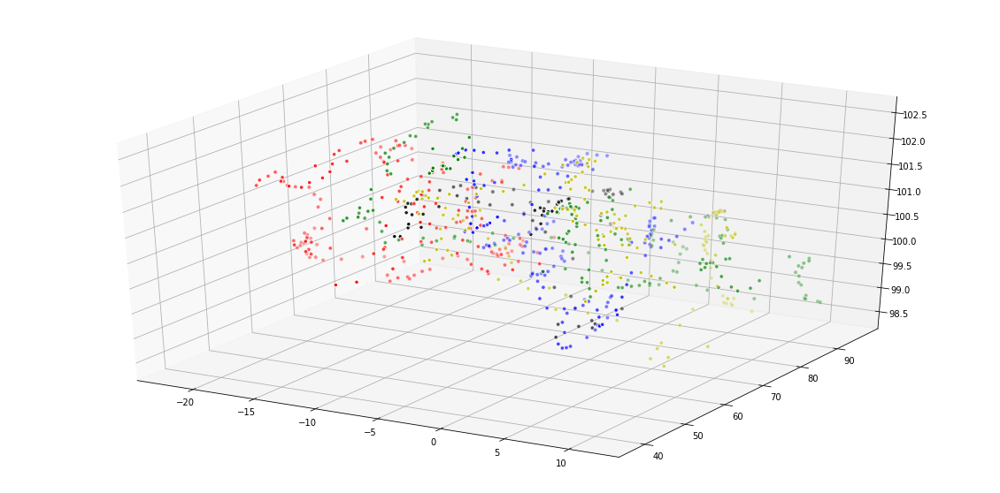

In [13]:


fig = plt.figure(figsize=(20,10))
ax = plt.axes(projection="3d")  

ax.scatter(x1, y1, z1, c ='r', marker='o',edgecolors='w')
ax.scatter(x2, y2, z2, c ='g', marker='o',edgecolors='w')
ax.scatter(x3, y3, z3, c ='b', marker='o',edgecolors='w')
ax.scatter(x4, y4, z4, c ='y', marker='o',edgecolors='w')
ax.scatter(x5, y5, z5, c ='black', marker='o',edgecolors='w')

No discernible patterns are observed from plotting the variables together for all the weeks.

We try and identify patterns between two variables each and mark the weeks in different color to understand the patterns

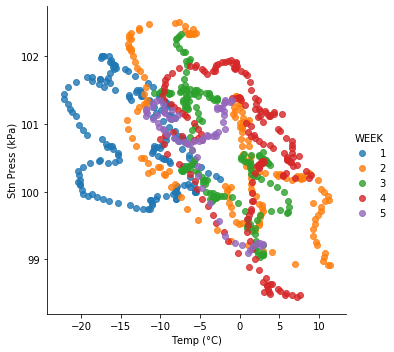

In [9]:
sns.lmplot('Temp (°C)', 'Stn Press (kPa)', data=df, hue='WEEK', fit_reg=False)



Temperature and Pressure show discernible patterns over different weeks

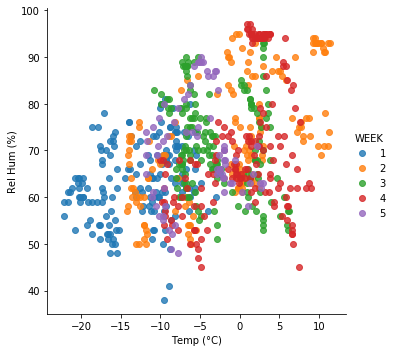

In [10]:
sns.lmplot('Temp (°C)', 'Rel Hum (%)', data=df, hue='WEEK', fit_reg=False)


There is only a minor seperation show in the plot of temperature and humidity

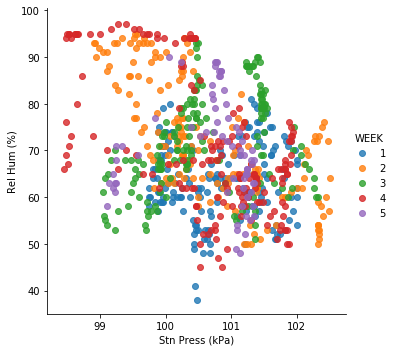

In [11]:
sns.lmplot('Stn Press (kPa)', 'Rel Hum (%)', data=df, hue='WEEK', fit_reg=False)


Almost no seperation exhibited in the plot of pressure vs humidity

In [14]:
data = df[['Temp (°C)','Rel Hum (%)','Stn Press (kPa)']].copy()
data

,Temp (°C),Rel Hum (%),Stn Press (kPa)
Date/Time,,,
2018-01-01 00:00,-16.9,70,101.64
2018-01-01 01:00,-16.3,69,101.61
2018-01-01 02:00,-17.6,71,101.67
2018-01-01 03:00,-18.6,75,101.63
2018-01-01 04:00,-17.8,75,101.60
...,...,...,...
2018-01-31 19:00,1.7,65,99.20
2018-01-31 20:00,2.7,62,99.20
2018-01-31 21:00,2.9,63,99.23


In [0]:
scaler = StandardScaler()
#scaler = MinMaxScaler()

scaled_data = data


We scale the variables by diffrencing the mean and dividing by the standard deviation of each columns - No prominent changes observed

In [0]:
col = ['Temp (°C)','Rel Hum (%)','Stn Press (kPa)']
scaled_data=pd.DataFrame(scaler.fit_transform(scaled_data),columns = col,index =data.index )

In [17]:
scaled_data['WEEK'] = WEEK
scaled_data

,Temp (°C),Rel Hum (%),Stn Press (kPa),WEEK
Date/Time,,,,
2018-01-01 00:00,-1.732347,0.025060,1.107527,1
2018-01-01 01:00,-1.650122,-0.057438,1.073056,1
2018-01-01 02:00,-1.828276,0.107558,1.141998,1
2018-01-01 03:00,-1.965318,0.437548,1.096037,1
2018-01-01 04:00,-1.855684,0.437548,1.061566,1
...,...,...,...,...
2018-01-31 19:00,0.816634,-0.387429,-1.696133,5
2018-01-31 20:00,0.953676,-0.634922,-1.696133,5
2018-01-31 21:00,0.981084,-0.552424,-1.661661,5


In [0]:
x1 = scaled_data['Temp (°C)'].loc[:'2018-01-07 23:00']
y1 = scaled_data['Rel Hum (%)'].loc[:'2018-01-07 23:00']
z1 = scaled_data['Stn Press (kPa)'].loc[:'2018-01-07 23:00']

x2 = scaled_data['Temp (°C)'].loc['2018-01-08 00:00':'2018-01-14 23:00']
y2 = scaled_data['Rel Hum (%)'].loc['2018-01-08 00:00':'2018-01-14 23:00']
z2 = scaled_data['Stn Press (kPa)'].loc['2018-01-08 00:00':'2018-01-14 23:00']

x3 = scaled_data['Temp (°C)'].loc['2018-01-15 00:00':'2018-01-21 23:00']
y3 = scaled_data['Rel Hum (%)'].loc['2018-01-15 00:00':'2018-01-21 23:00']
z3 = scaled_data['Stn Press (kPa)'].loc['2018-01-15 00:00':'2018-01-21 23:00']

x4 = scaled_data['Temp (°C)'].loc['2018-01-22 00:00':'2018-01-28 23:00']
y4 = scaled_data['Rel Hum (%)'].loc['2018-01-22 00:00':'2018-01-28 23:00']
z4 = scaled_data['Stn Press (kPa)'].loc['2018-01-22 00:00':'2018-01-28 23:00']

x5 = scaled_data['Temp (°C)'].loc['2018-01-29 00:00':]
y5 = scaled_data['Rel Hum (%)'].loc['2018-01-29 00:00':]
z5 = scaled_data['Stn Press (kPa)'].loc['2018-01-29 00:00':]

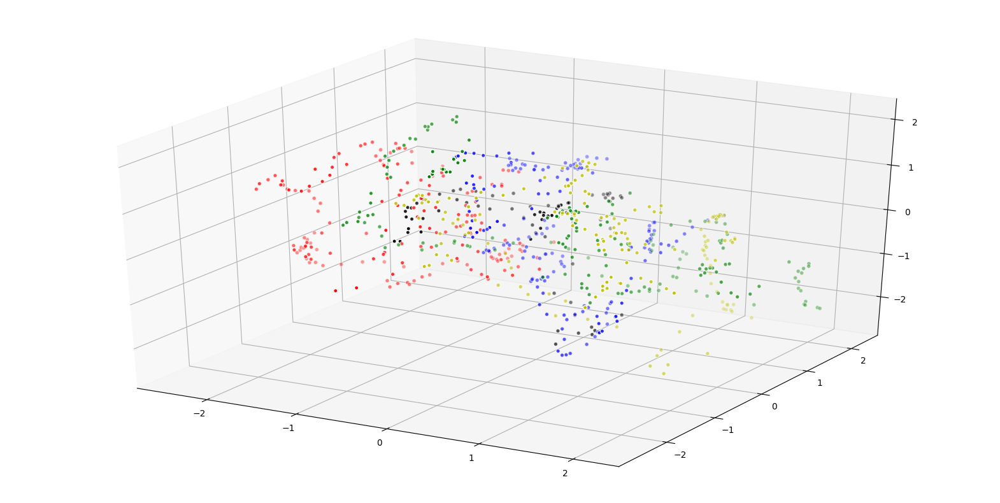

In [122]:
fig = plt.figure(figsize=(20,10))
ax = plt.axes(projection="3d")  

ax.scatter(x1, y1, z1, c ='r', marker='o',edgecolors='w')
ax.scatter(x2, y2, z2, c ='g', marker='o',edgecolors='w')
ax.scatter(x3, y3, z3, c ='b', marker='o',edgecolors='w')
ax.scatter(x4, y4, z4, c ='y', marker='o',edgecolors='w')
ax.scatter(x5, y5, z5, c ='black', marker='o',edgecolors='w')

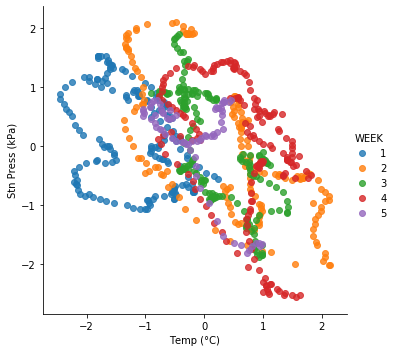

In [18]:
sns.lmplot('Temp (°C)', 'Stn Press (kPa)', data=scaled_data, hue='WEEK', fit_reg=False,)

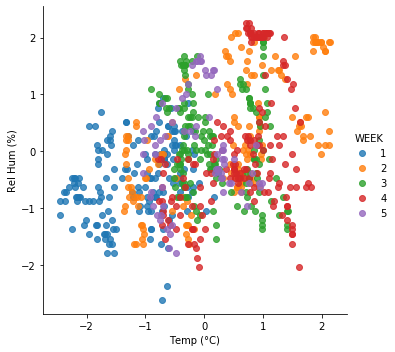

In [19]:
sns.lmplot('Temp (°C)', 'Rel Hum (%)', data=scaled_data, hue='WEEK', fit_reg=False,)


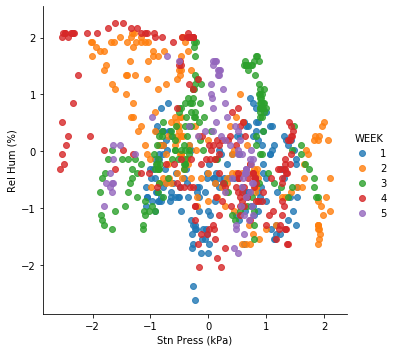

In [20]:
sns.lmplot('Stn Press (kPa)', 'Rel Hum (%)', data=scaled_data, hue='WEEK', fit_reg=False)


We now estimate the Kernel Density Estimator for two variables at a time to identify topological features and patterns, week by week since the variables displayed different patterns in the initial plots by week. 

The KDE is plotted against the variables and we look at the super level sets to evaluate the formation of clusters. A higher value of KDE(PDF) indicates larger number of data points in the cluster and as we evaluate the level sets for higher value of the KDE's we should only see the most relevant clusters

TEMERATURE VS PRESSURE WEEKLY 

Temperature vs Pressure displays a higher number of clusters in the initial weeks and later shows a decline indicating a convergence in the variable values as we approach February

Week 5 has lesser number of peaks and shows a pattern of convergence in the variables through out the day. 

The peaks appear at different values of the variables across weeks and is seen converging to two distinct peaks around week 5.

-2.72864178240171 0.5110302156680913 -1.3364828066845098 1.7935045502133369


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

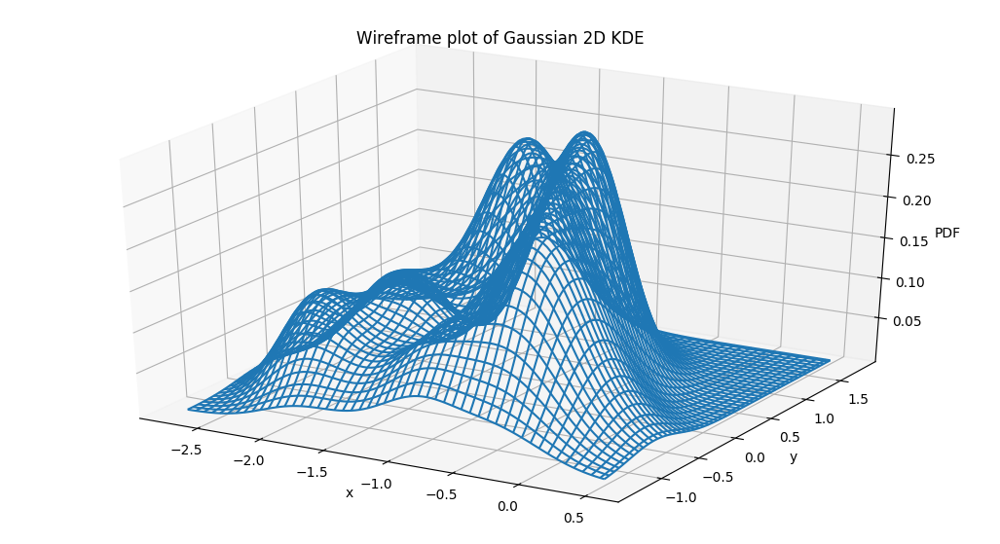

In [123]:
from scipy import stats

x = scaled_data[scaled_data['WEEK']=='1']['Temp (°C)']
y = scaled_data[scaled_data['WEEK']=='1']['Stn Press (kPa)']

#x = scaled_data['Temp (°C)']
#y = scaled_data['Stn Press (kPa)']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')



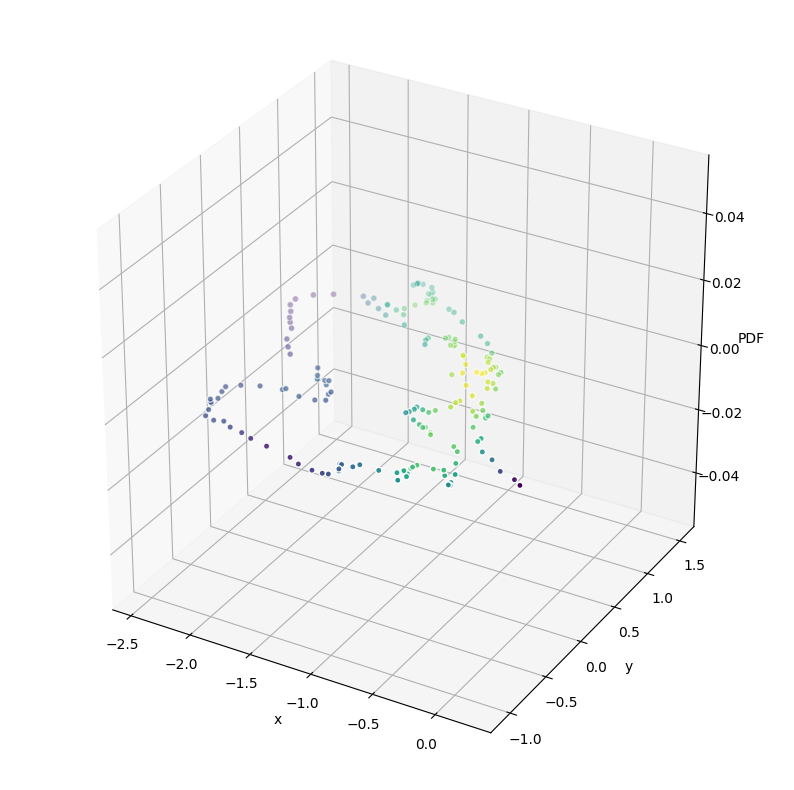

In [124]:

kde = stats.gaussian_kde(values)

density = kde(values)
fig, ax = plt.subplots(subplot_kw=dict(projection='3d'),figsize=(10,10))
x, y = values
ax.scatter(x, y, c=density,edgecolors='w')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
plt.show()

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

X=[]
Y=[]
df_sup = pd.DataFrame()

def SUP_SETS(e):
  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)

  return(df_sup)
  
  



In [0]:
df_sup = SUP_SETS(0.1)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


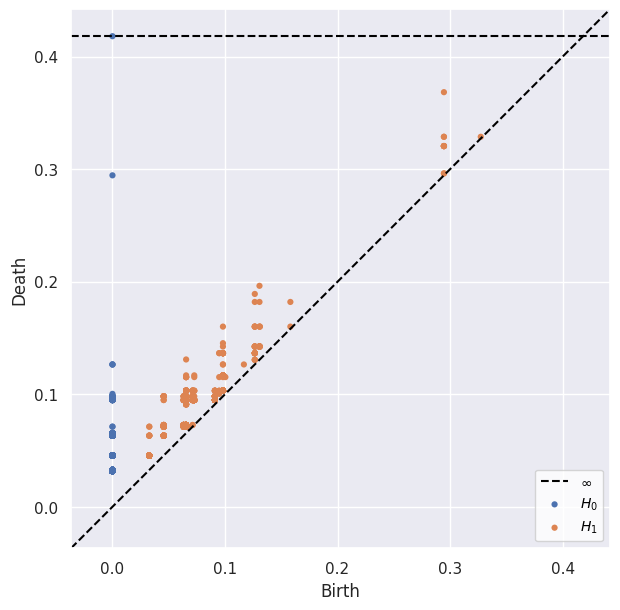

In [132]:

sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.125)


Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


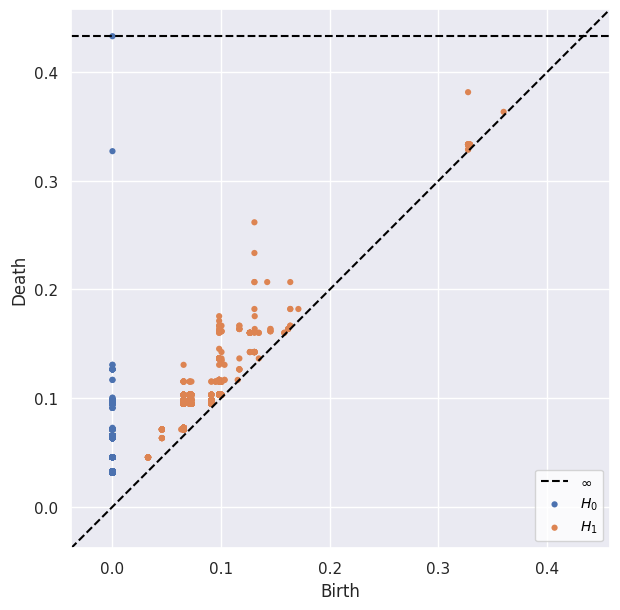

In [136]:

sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.15)


Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


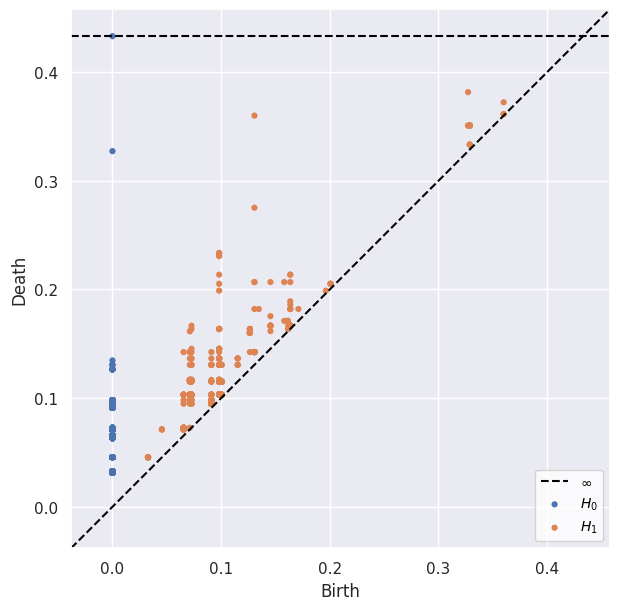

In [142]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.2)


Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


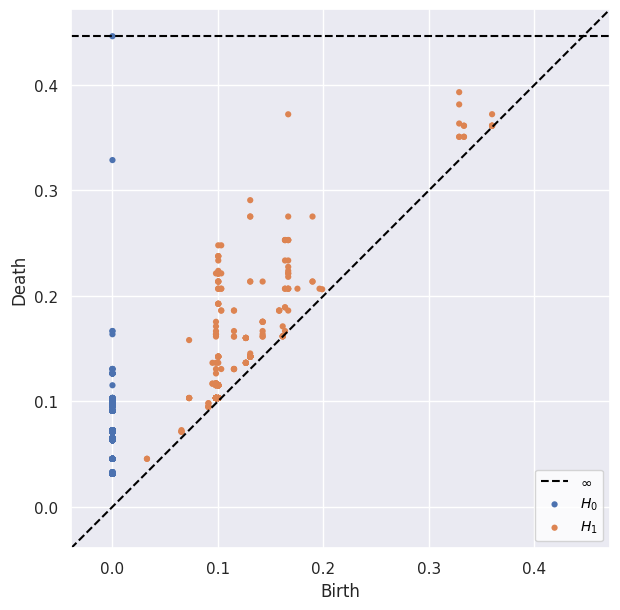

In [150]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

During week one there are 4-5 clusters that we can observe which probably indicates temperatures varying at different times of the day. 

-1.7131608388442978 2.4967682550941244 -2.4430091740459656 2.5208474272017094


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

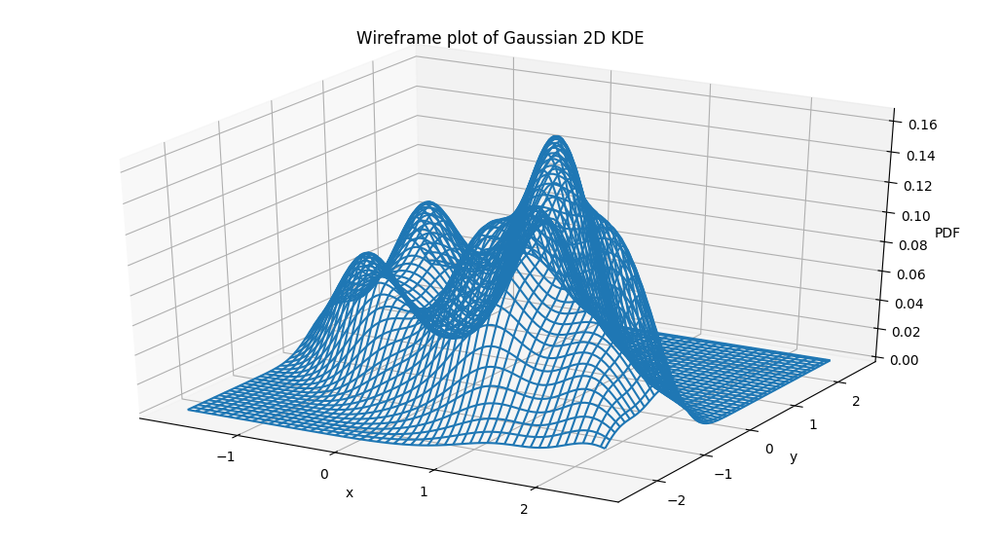

In [154]:
x = scaled_data[scaled_data['WEEK']=='2']['Temp (°C)']
y = scaled_data[scaled_data['WEEK']=='2']['Stn Press (kPa)']

#x = scaled_data['Temp (°C)']
#y = scaled_data['Stn Press (kPa)']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')


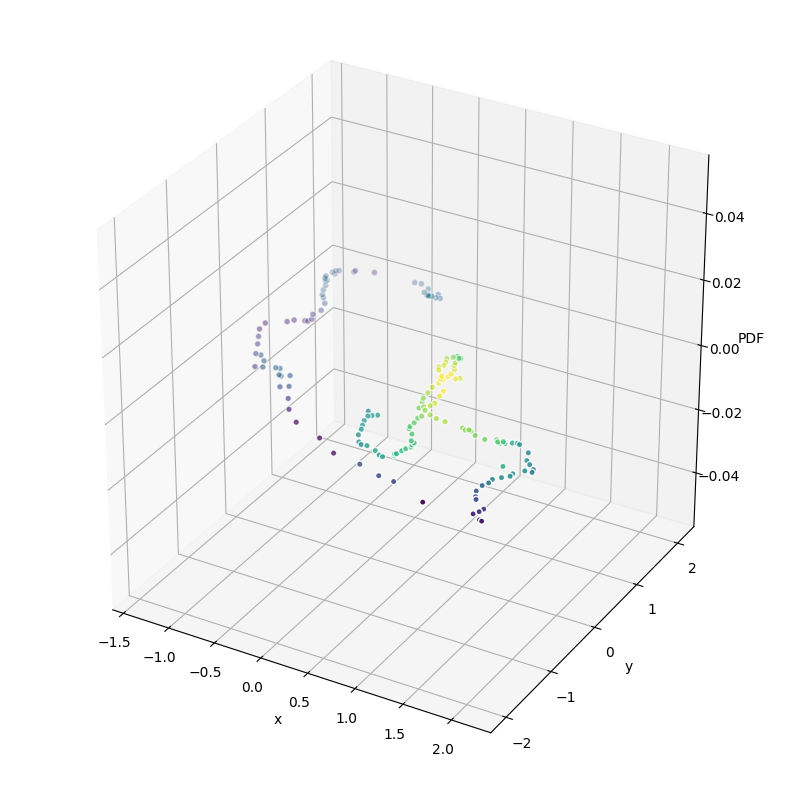

In [155]:
kde = stats.gaussian_kde(values)

density = kde(values)
fig, ax = plt.subplots(subplot_kw=dict(projection='3d'),figsize=(10,10))
x, y = values
ax.scatter(x, y, c=density,edgecolors='w')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
plt.show()

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

X=[]
Y=[]

def SUP_SETS(e):
  df_sup = pd.DataFrame()

  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)

In [0]:
df_sup = SUP_SETS(0.1)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


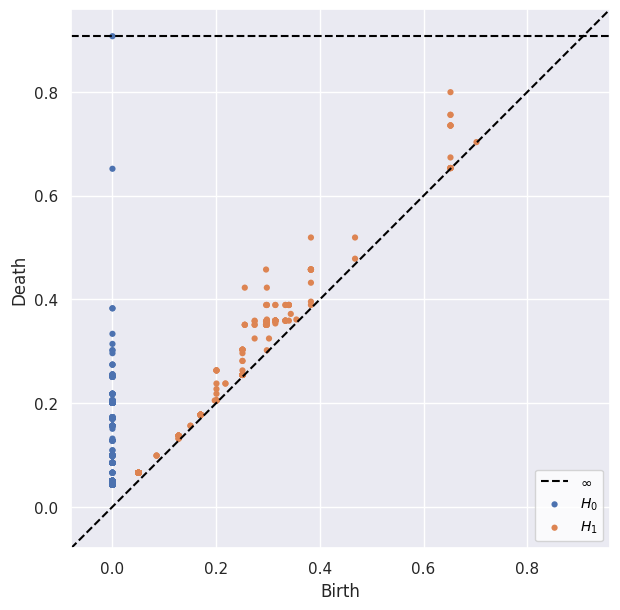

In [158]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.125)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


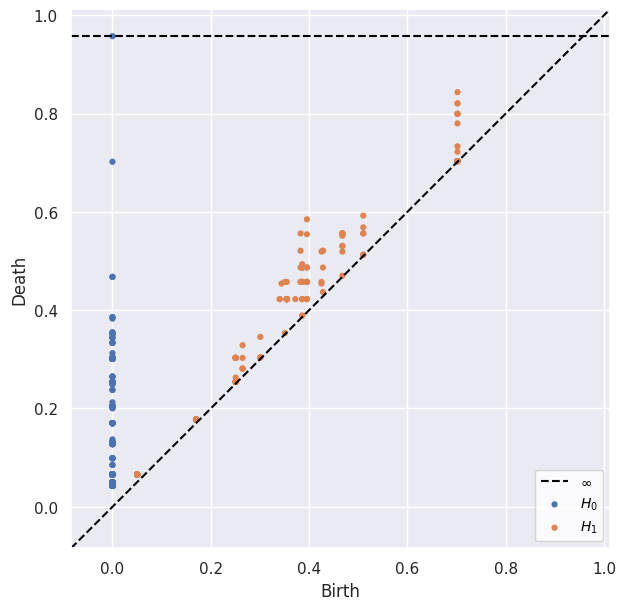

In [161]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.15)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


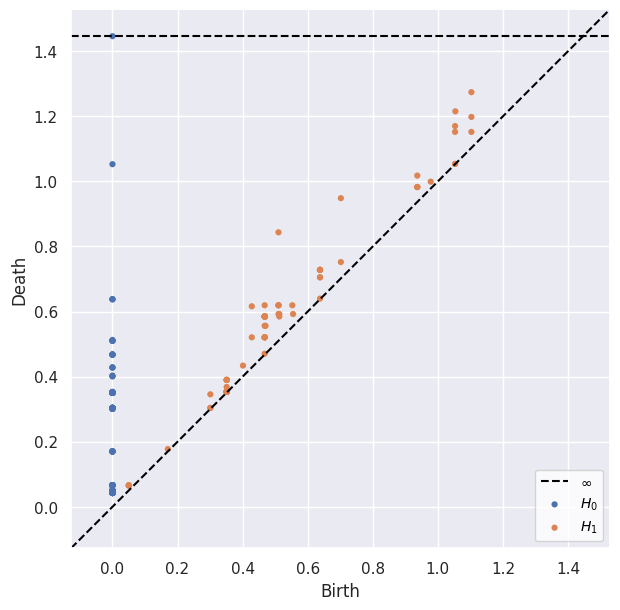

In [164]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

Week 2 is similar to Week 1 and displays 5-6 clusters corresponding to different values at different times of the day

-1.1293620777708058 1.6662939611726781 -2.258013592379084 2.278399801538909


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

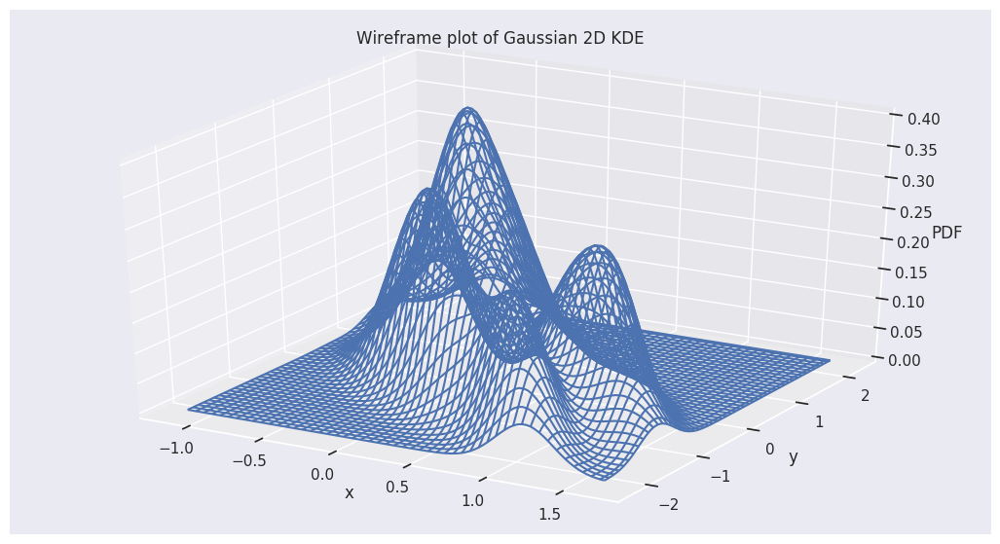

In [171]:
x = scaled_data[scaled_data['WEEK']=='3']['Temp (°C)']
y = scaled_data[scaled_data['WEEK']=='3']['Stn Press (kPa)']

#x = scaled_data['Temp (°C)']
#y = scaled_data['Stn Press (kPa)']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')

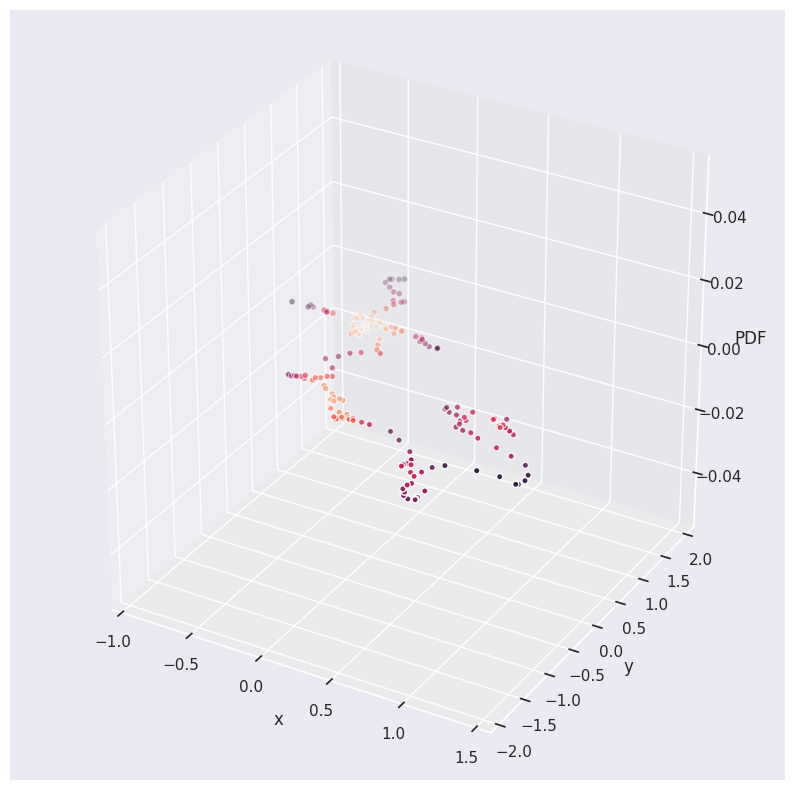

In [172]:
kde = stats.gaussian_kde(values)

density = kde(values)
fig, ax = plt.subplots(subplot_kw=dict(projection='3d'),figsize=(10,10))
x, y = values
ax.scatter(x, y, c=density,edgecolors='w')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
plt.show()

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

X=[]
Y=[]

df_sup = pd.DataFrame()

def SUP_SETS(e):
  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)
  

In [0]:
df_sup = SUP_SETS(0.1)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


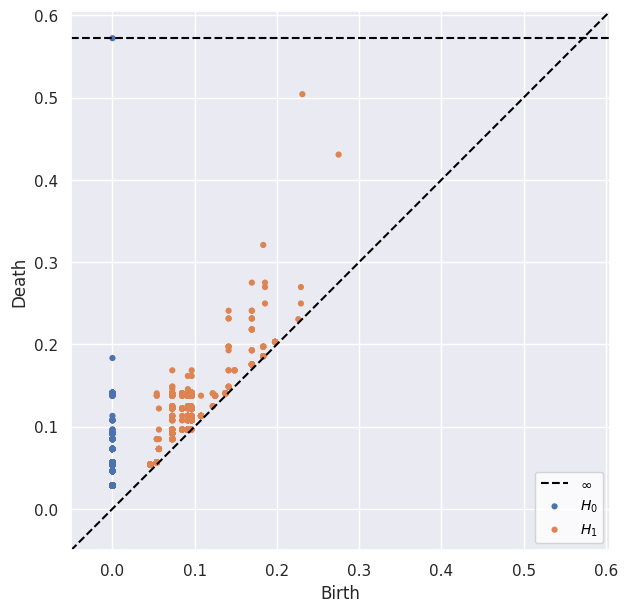

In [175]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.15)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


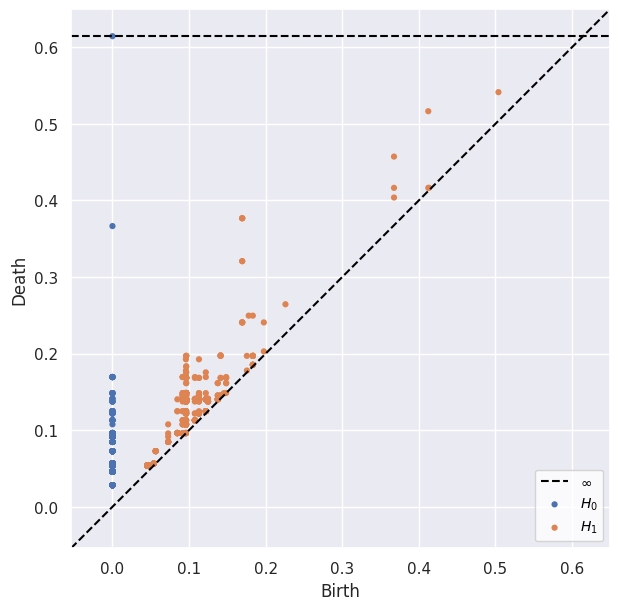

In [178]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.2)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


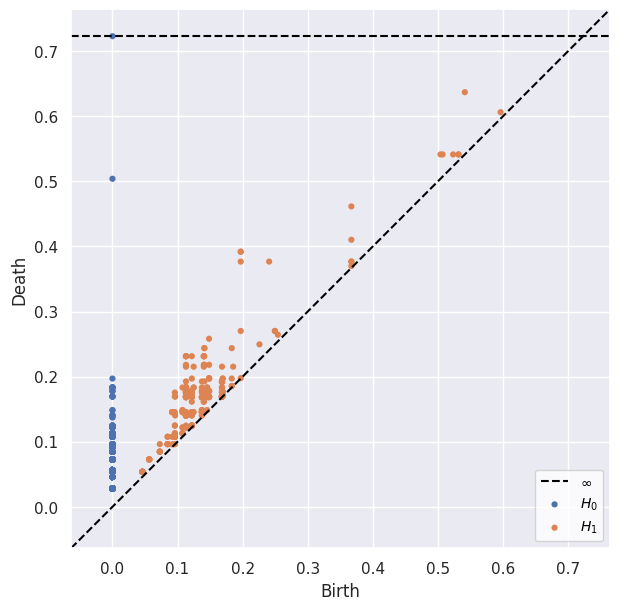

In [181]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.3)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


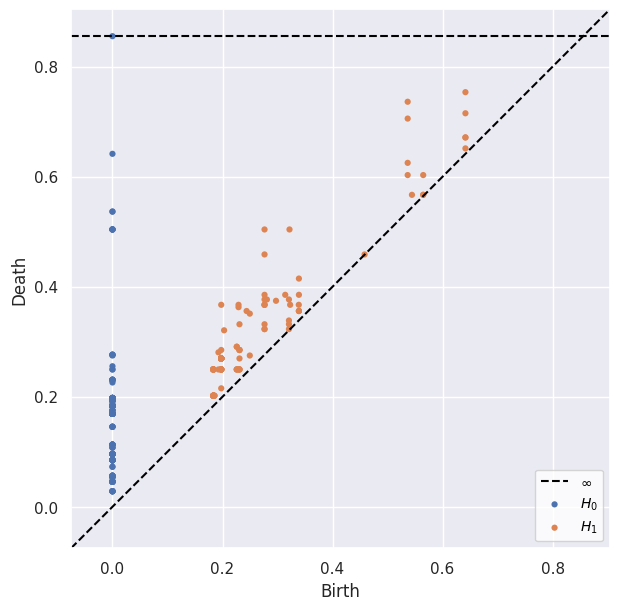

In [184]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.35)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


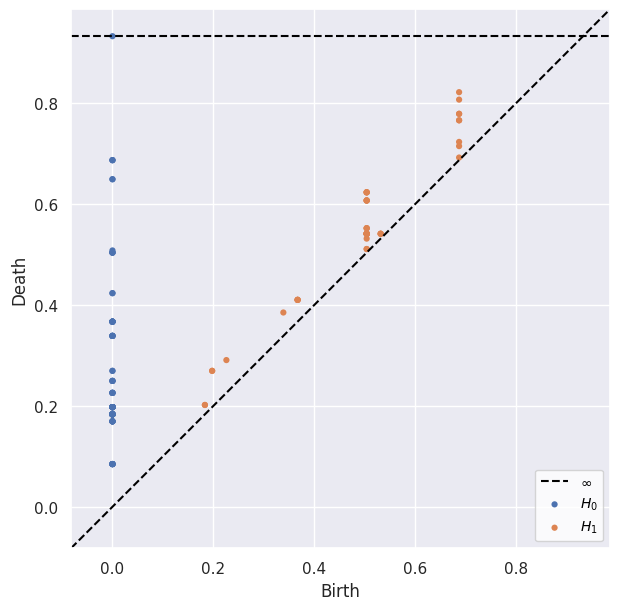

In [190]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

Week 3 shows a lesser number of clusters than previous weeks and this could indicate that the variables are converging at different times of the day and there is not as much variation as before

-1.047136900154821 2.077419849252602 -2.9727170196883654 1.8670431665281135


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

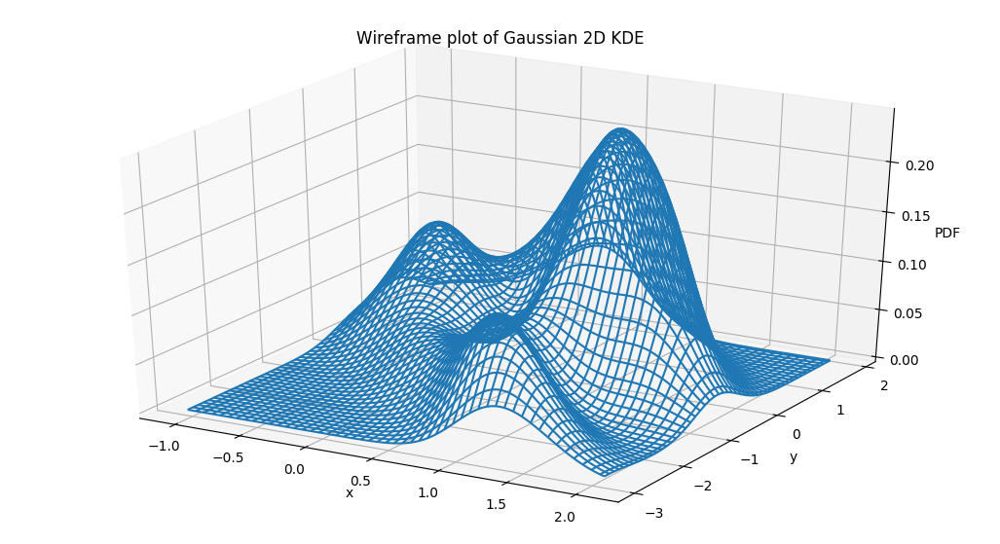

In [191]:
x = scaled_data[scaled_data['WEEK']=='4']['Temp (°C)']
y = scaled_data[scaled_data['WEEK']=='4']['Stn Press (kPa)']

#x = scaled_data['Temp (°C)']
#y = scaled_data['Stn Press (kPa)']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')

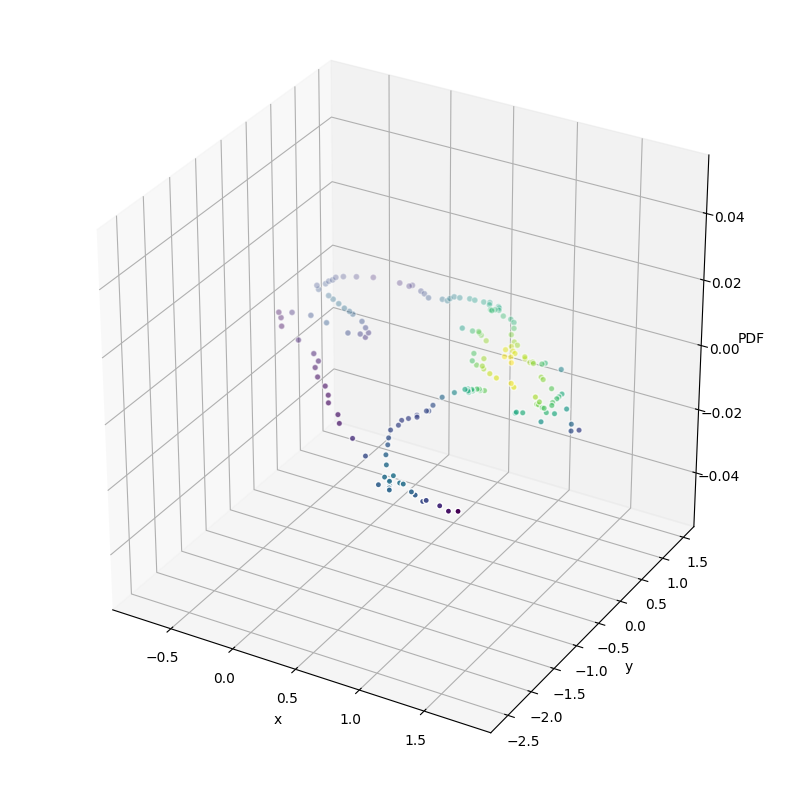

In [192]:
kde = stats.gaussian_kde(values)

density = kde(values)
fig, ax = plt.subplots(subplot_kw=dict(projection='3d'),figsize=(10,10))
x, y = values
ax.scatter(x, y, c=density,edgecolors='w')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
plt.show()

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

X=[]
Y=[]
df_sup = pd.DataFrame()

def SUP_SETS(e):
  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)
  

In [0]:
df_sup = SUP_SETS(0.075)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


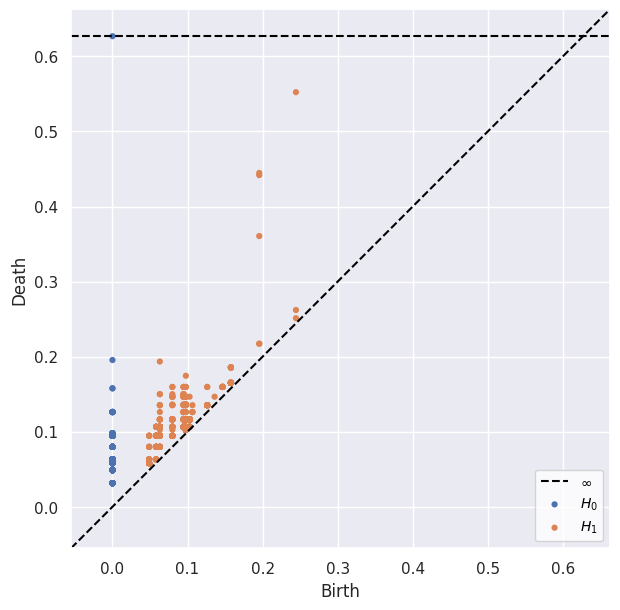

In [196]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.125)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


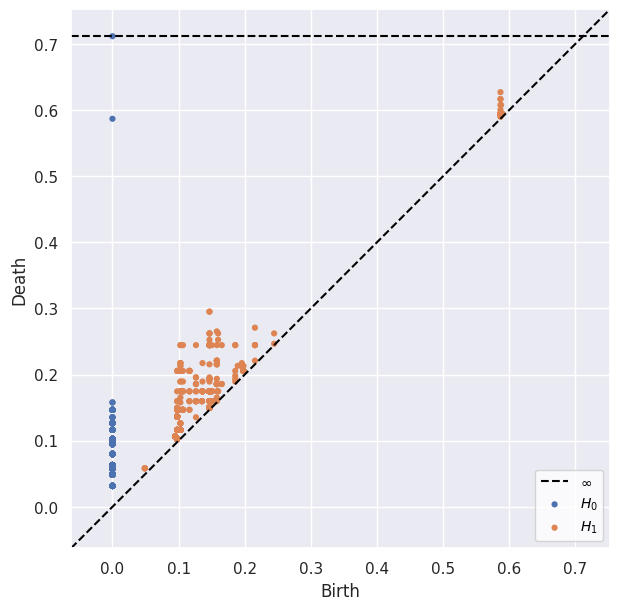

In [199]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.175)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


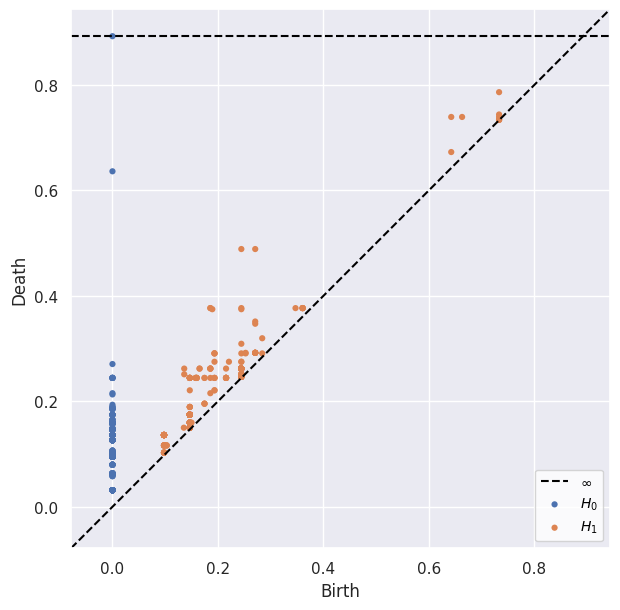

In [202]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

Week 4 continues the same pattern as week 3 and we have lesser number of prominent clusters indicating convergence of values.

-1.2348843890446528 1.1825358328653008 -2.0695708880724744 1.0328394877073155


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

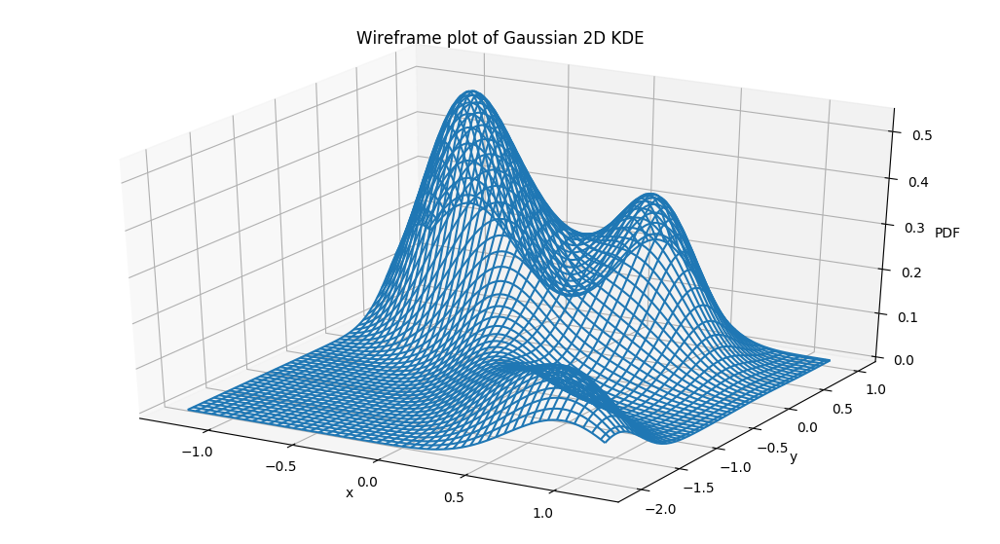

In [203]:
x = scaled_data[scaled_data['WEEK']=='5']['Temp (°C)']
y = scaled_data[scaled_data['WEEK']=='5']['Stn Press (kPa)']

#x = scaled_data['Temp (°C)']
#y = scaled_data['Stn Press (kPa)']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')

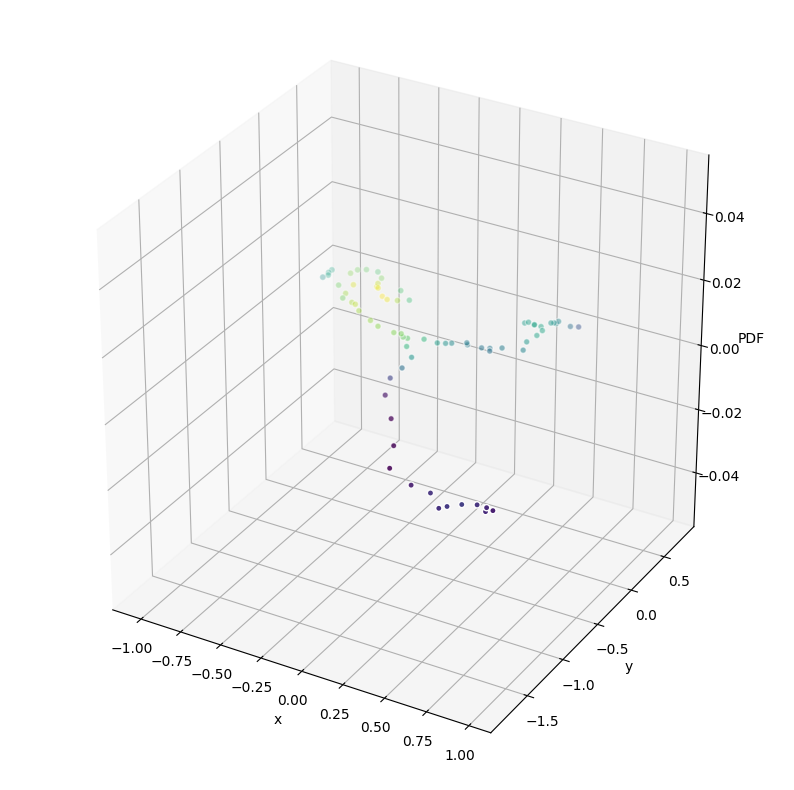

In [204]:
kde = stats.gaussian_kde(values)

density = kde(values)
fig, ax = plt.subplots(subplot_kw=dict(projection='3d'),figsize=(10,10))
x, y = values
ax.scatter(x, y, c=density,edgecolors='w')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
plt.show()

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

X=[]
Y=[]
df_sup = pd.DataFrame()

def SUP_SETS(e):
  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)

In [0]:
df_sup = SUP_SETS(0.1)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


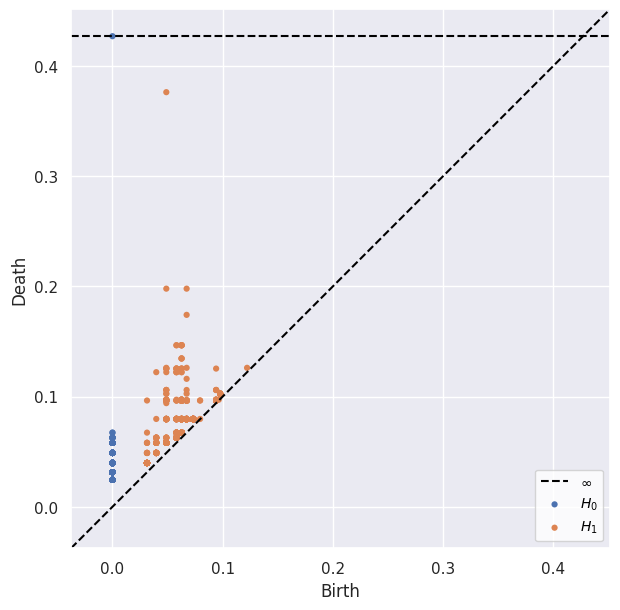

In [207]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.2)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


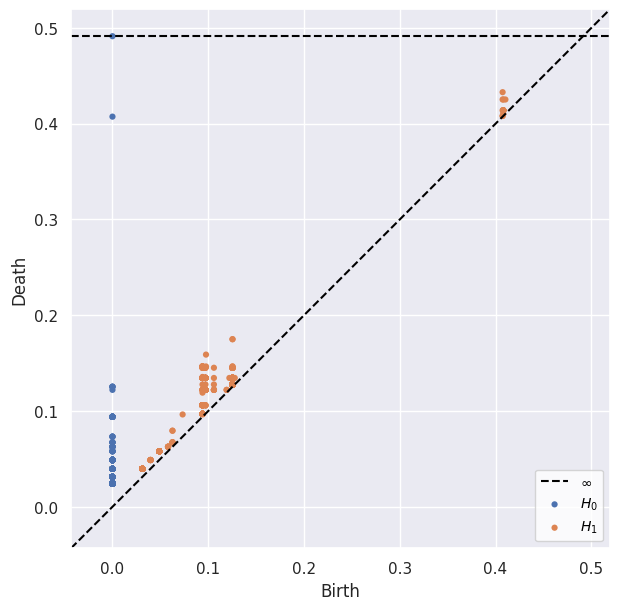

In [210]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.3)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


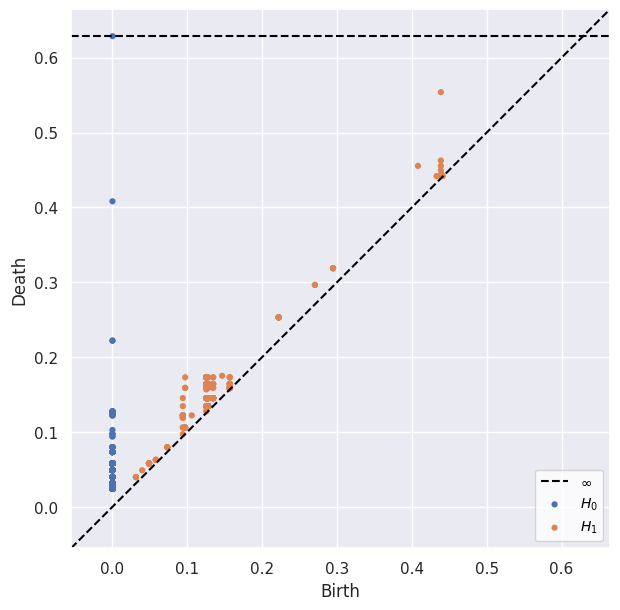

In [213]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.4)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


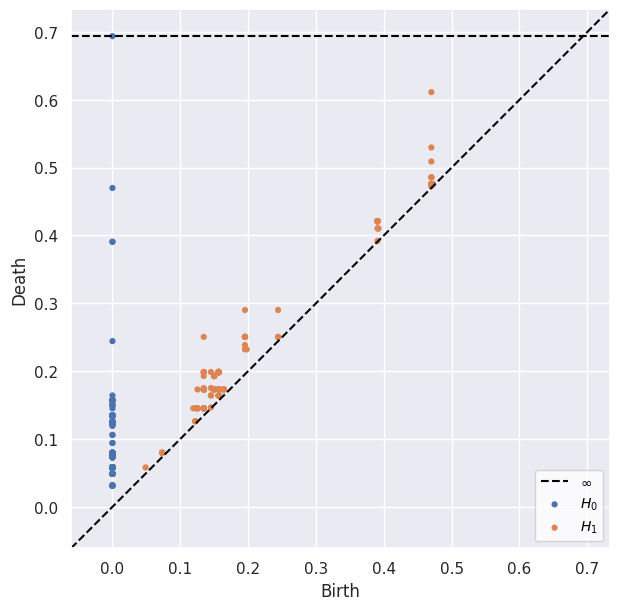

In [216]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

Week 5 has lesser number of peaks and shows a pattern of convergence in the variables through out the day. 

However the peaks appear at different values of the variables across weeks.

TEMPERATURE VS RELATIVE HUMIDITY

Temperature vs relative humidity shows different number of clusters and at different values across the weeks. This is evident from the persistent diagrams as well as the KDE plots. It would be difficult to predict the future values of the variables based on the estimated distributions of the past 

-2.72864178240171 0.5110302156680913 -2.969607274756278 1.2872748336183801


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

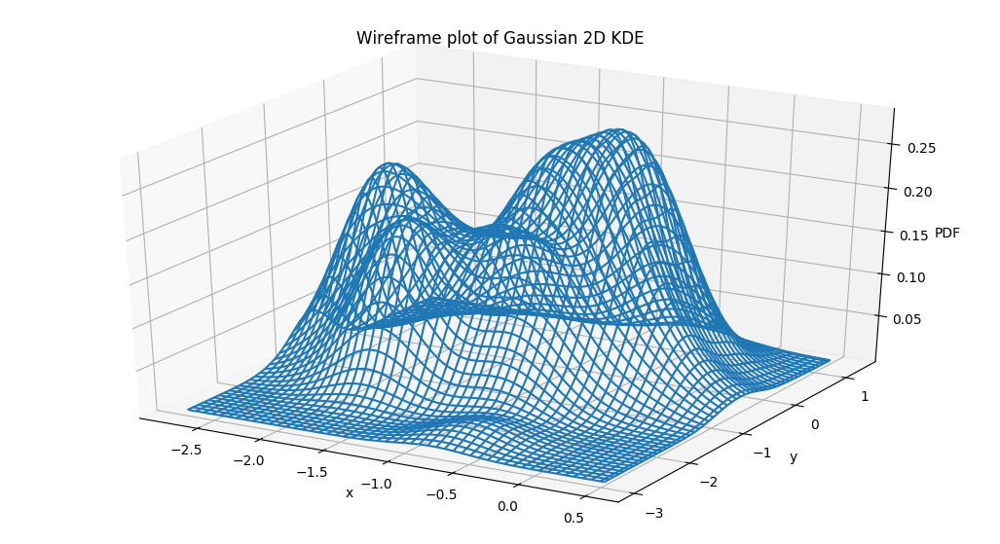

In [217]:
x = scaled_data[scaled_data['WEEK']=='1']['Temp (°C)']
y = scaled_data[scaled_data['WEEK']=='1']['Rel Hum (%)']

#x = scaled_data['Temp (°C)']
#y = scaled_data['Stn Press (kPa)']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')

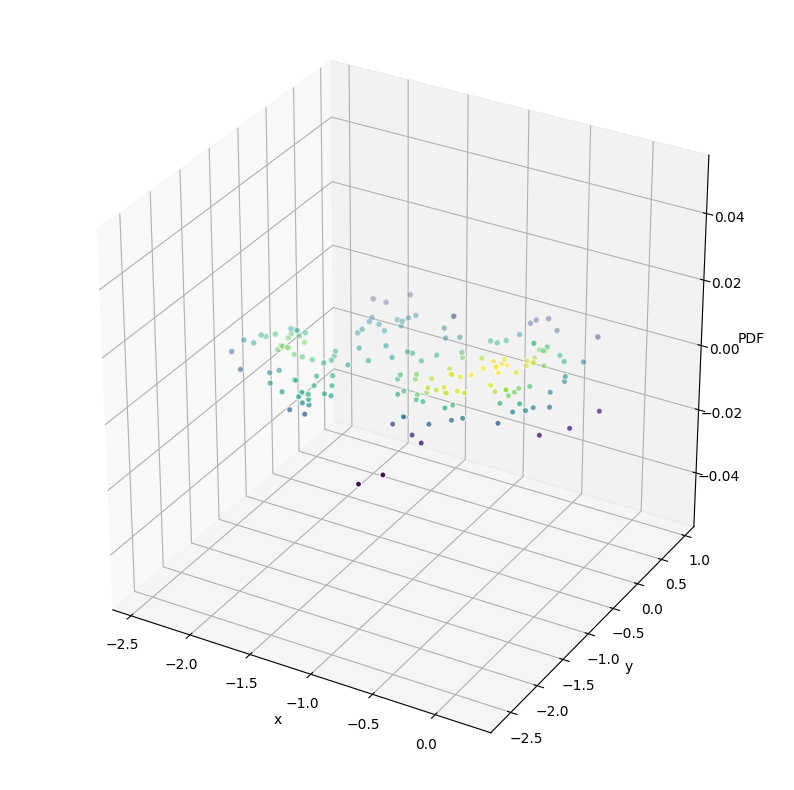

In [218]:
kde = stats.gaussian_kde(values)

density = kde(values)
fig, ax = plt.subplots(subplot_kw=dict(projection='3d'),figsize=(10,10))
x, y = values
ax.scatter(x, y, c=density,edgecolors='w')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
plt.show()

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

X=[]
Y=[]



df_sup = pd.DataFrame()

def SUP_SETS(e):
  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)
  

In [0]:
df_sup = SUP_SETS(0.1)


Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


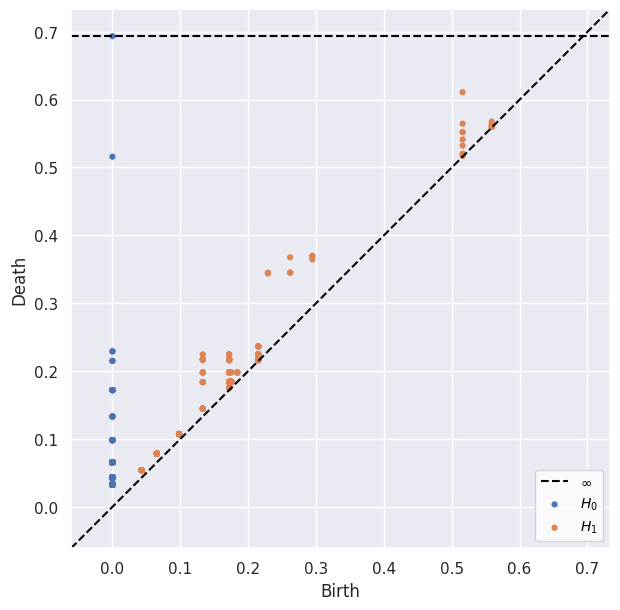

In [221]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


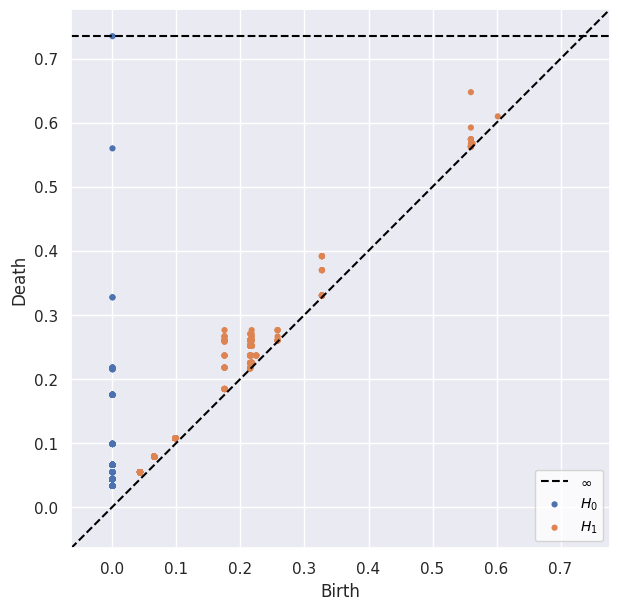

In [223]:
df_sup = SUP_SETS(0.15)
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


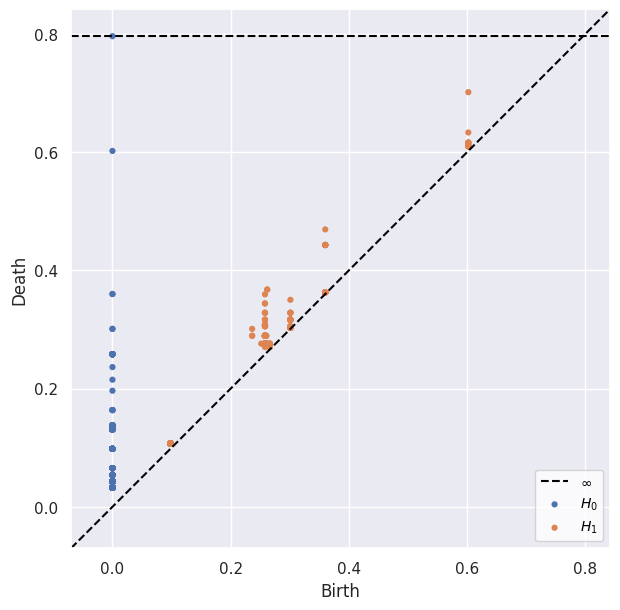

In [225]:
df_sup = SUP_SETS(0.2)
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

-1.7131608388442978 2.4967682550941244 -1.99613423446905 2.458742390574197


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

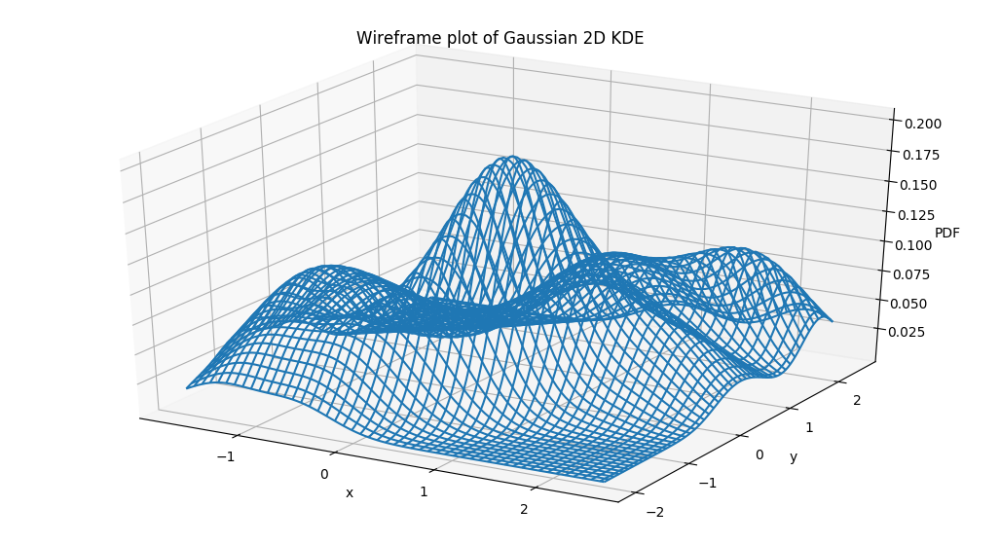

In [226]:
x = scaled_data[scaled_data['WEEK']=='2']['Temp (°C)']
y = scaled_data[scaled_data['WEEK']=='2']['Rel Hum (%)']

#x = scaled_data['Temp (°C)']
#y = scaled_data['Stn Press (kPa)']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

X=[]
Y=[]

df_sup = pd.DataFrame()

def SUP_SETS(e):
  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)

In [0]:
df_sup = SUP_SETS(0.05)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


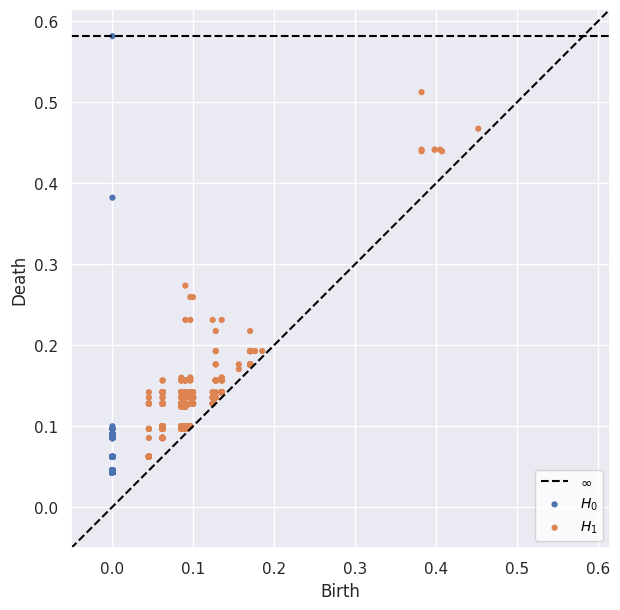

In [229]:

sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


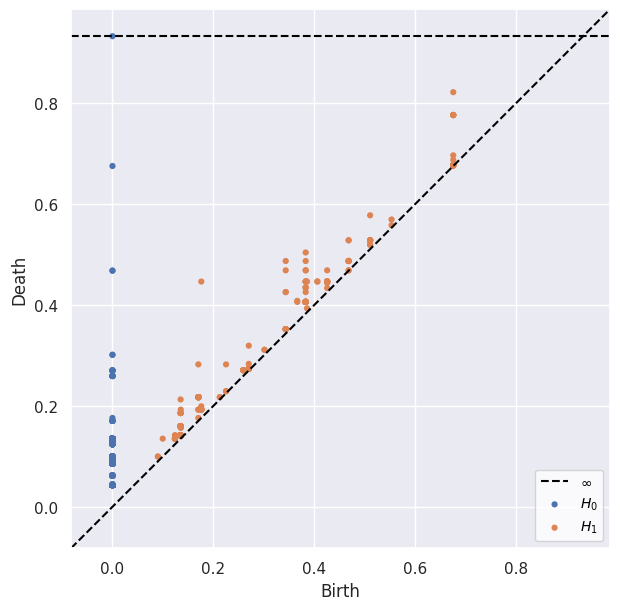

In [232]:
df_sup = SUP_SETS(0.1)

sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


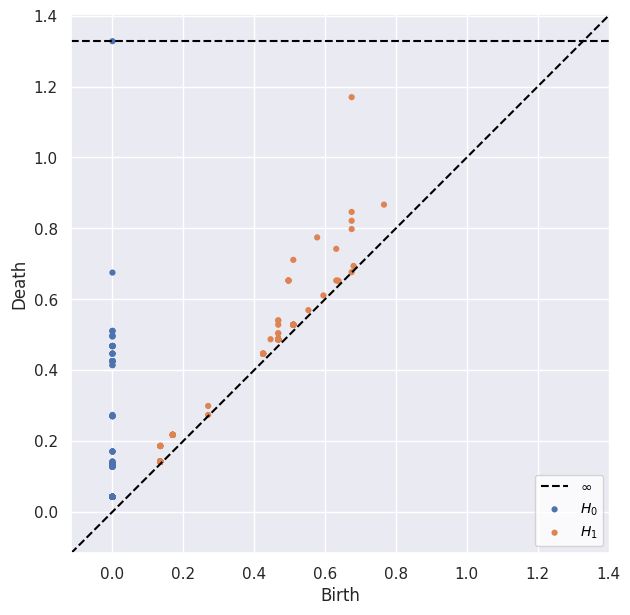

In [234]:
df_sup = SUP_SETS(0.15)

sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

-1.1293620777708058 1.6662939611726781 -1.8971369761347554 2.359745132239903


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

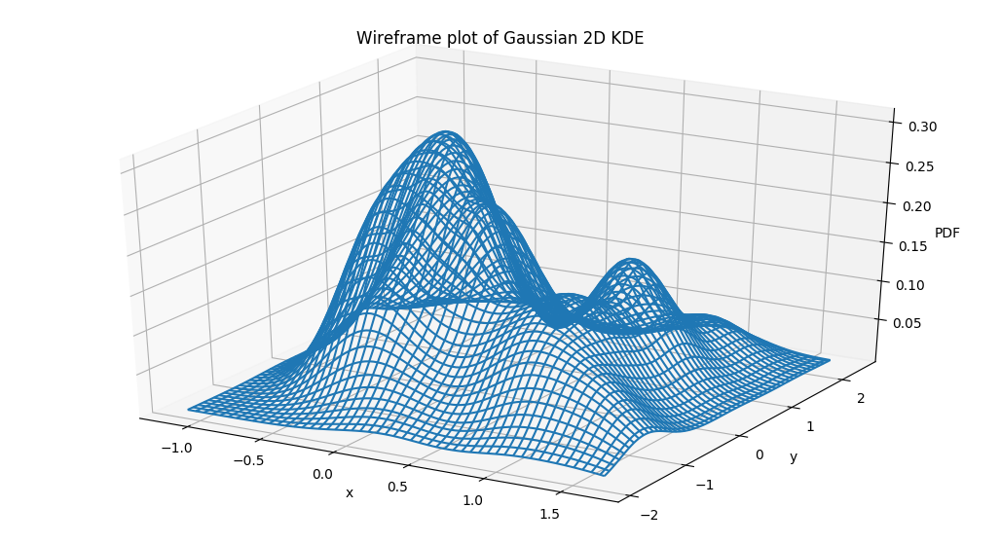

In [335]:
x = scaled_data[scaled_data['WEEK']=='3']['Temp (°C)']
y = scaled_data[scaled_data['WEEK']=='3']['Rel Hum (%)']

#x = scaled_data['Temp (°C)']
#y = scaled_data['Stn Press (kPa)']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

X=[]
Y=[]

df_sup = pd.DataFrame()

def SUP_SETS(e):
  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)

In [0]:
df_sup = SUP_SETS(0.1)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


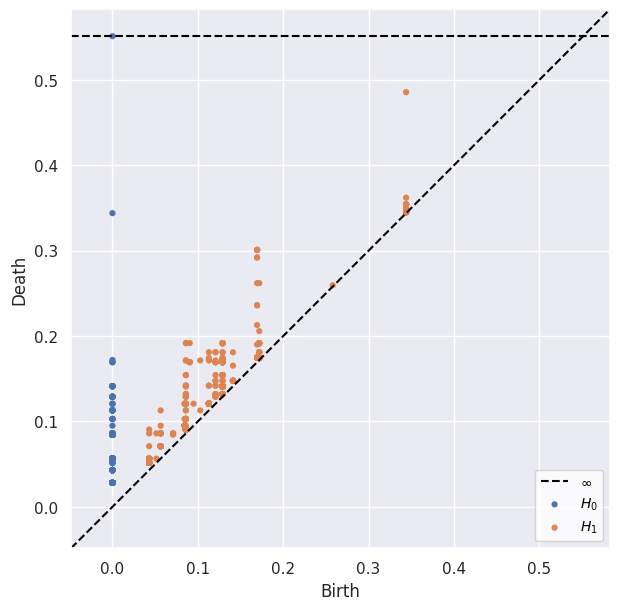

In [239]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


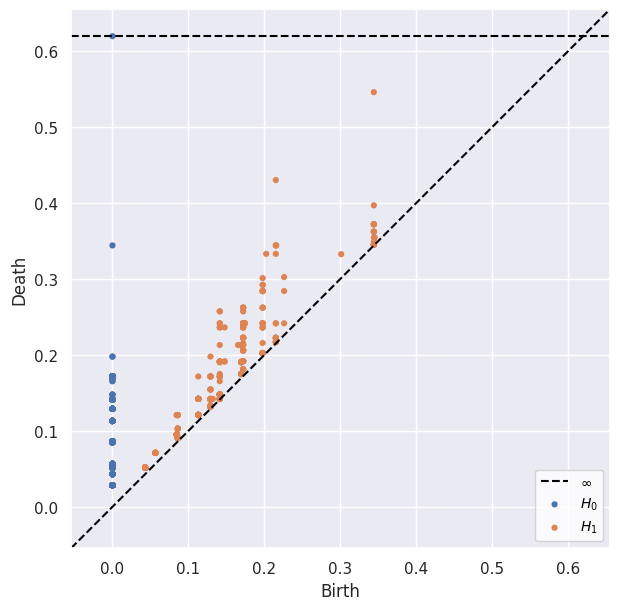

In [241]:
df_sup = SUP_SETS(0.15)
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


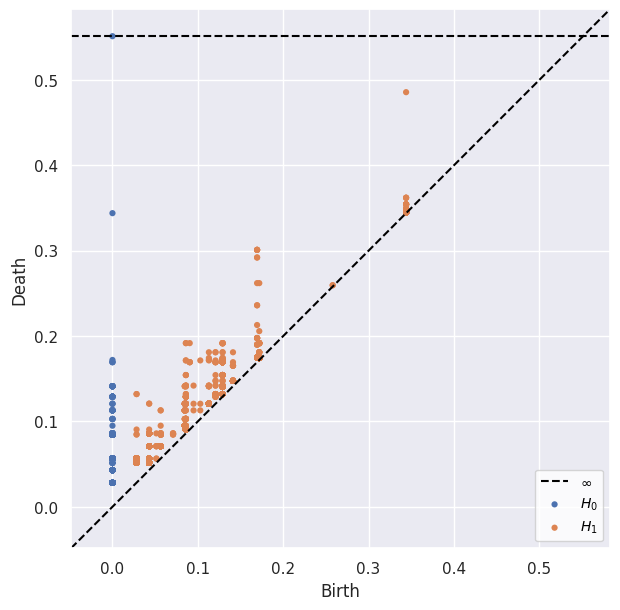

In [60]:
df_sup = SUP_SETS(0.2)

sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


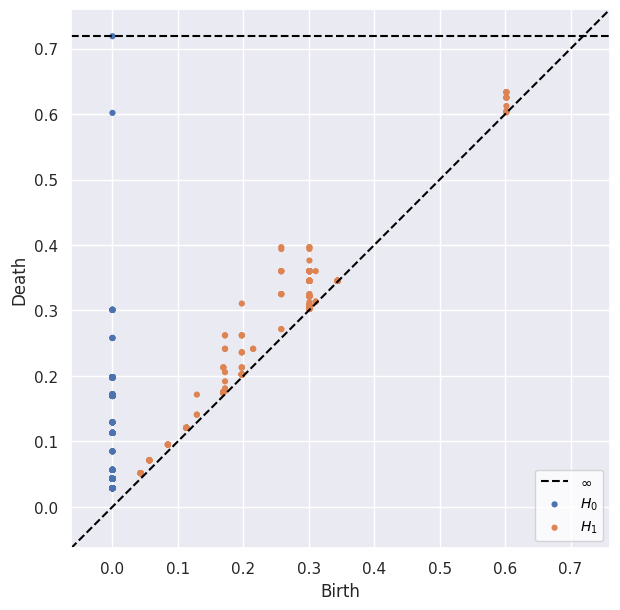

In [243]:
df_sup = SUP_SETS(0.25)
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

-1.047136900154821 2.077419849252602 -2.4663712115569485 2.6814862218263595


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

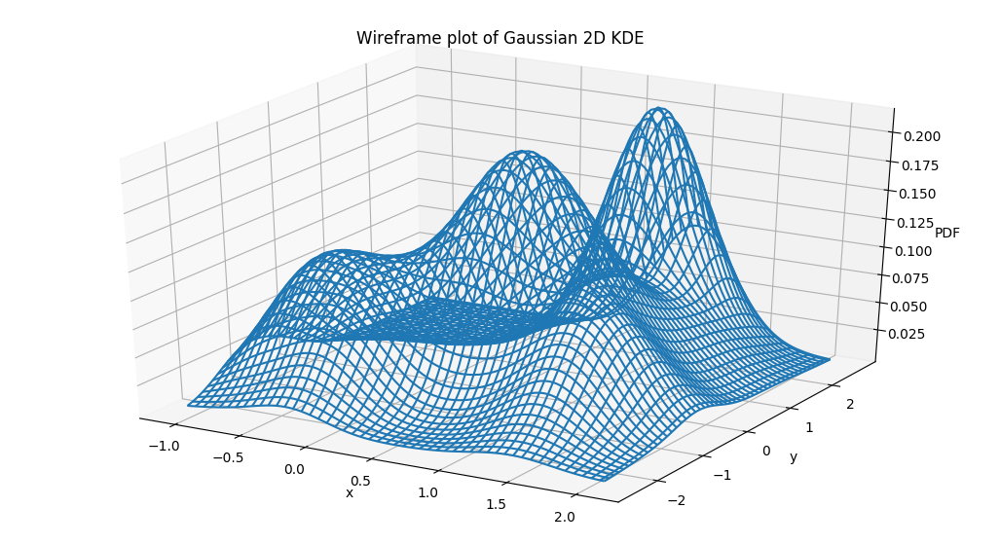

In [244]:
x = scaled_data[scaled_data['WEEK']=='4']['Temp (°C)']
y = scaled_data[scaled_data['WEEK']=='4']['Rel Hum (%)']

#x = scaled_data['Temp (°C)']
#y = scaled_data['Stn Press (kPa)']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

X=[]
Y=[]
df_sup = pd.DataFrame()

def SUP_SETS(e):
  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)

In [0]:
df_sup = SUP_SETS(0.075)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


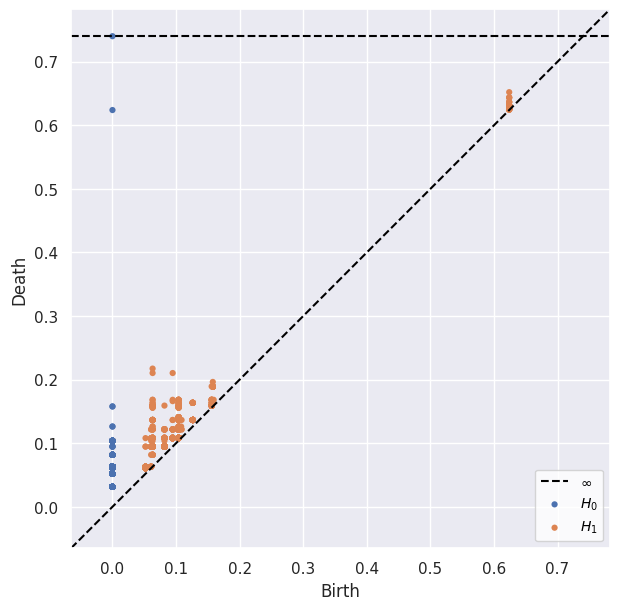

In [248]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.125)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


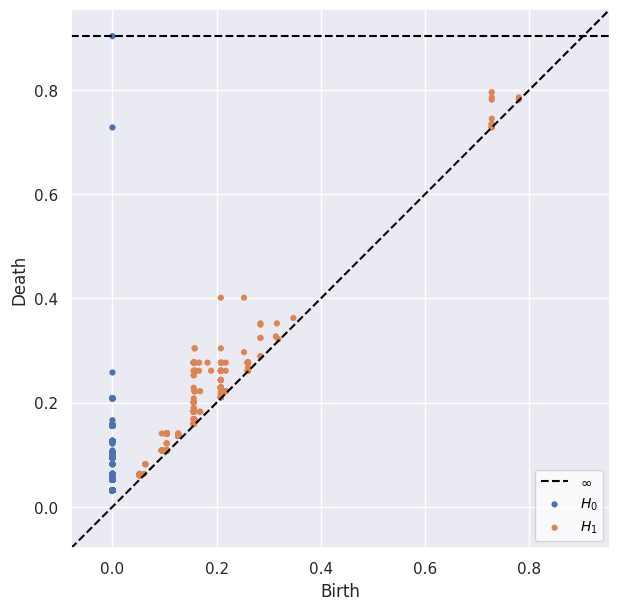

In [251]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.175)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


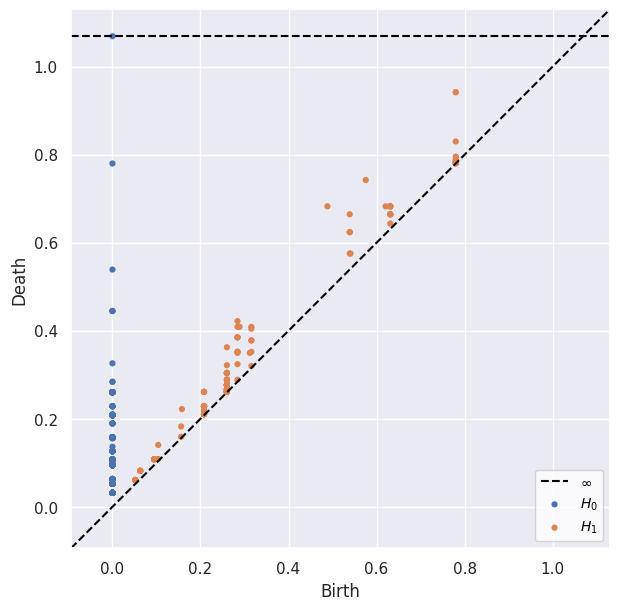

In [254]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

-1.2348843890446528 1.1825358328653008 -2.1363803504426335 2.02150449959773


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

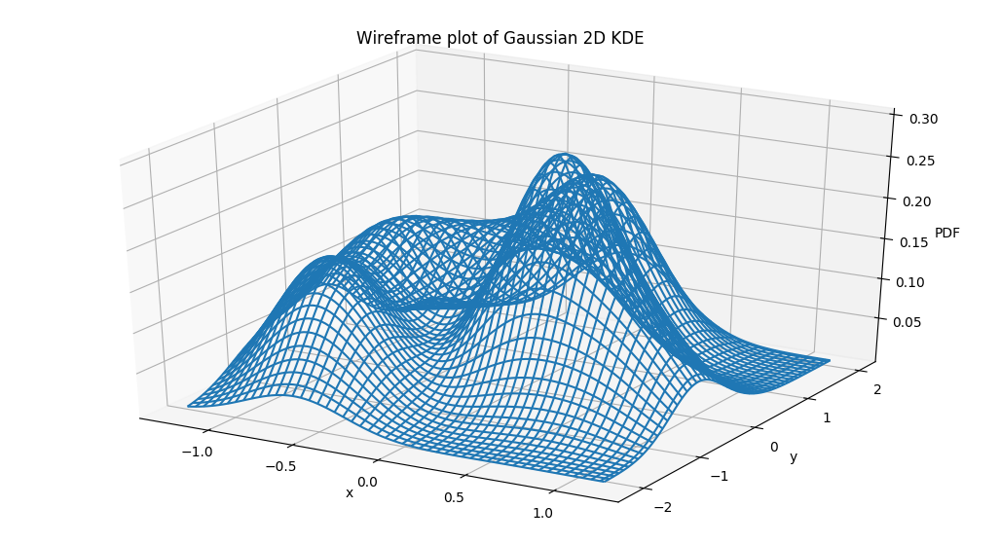

In [255]:
x = scaled_data[scaled_data['WEEK']=='5']['Temp (°C)']
y = scaled_data[scaled_data['WEEK']=='5']['Rel Hum (%)']

#x = scaled_data['Temp (°C)']
#y = scaled_data['Stn Press (kPa)']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

X=[]
Y=[]

df_sup = pd.DataFrame()
def SUP_SETS(e):
  
  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)

In [0]:
df_sup = SUP_SETS(0.1)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


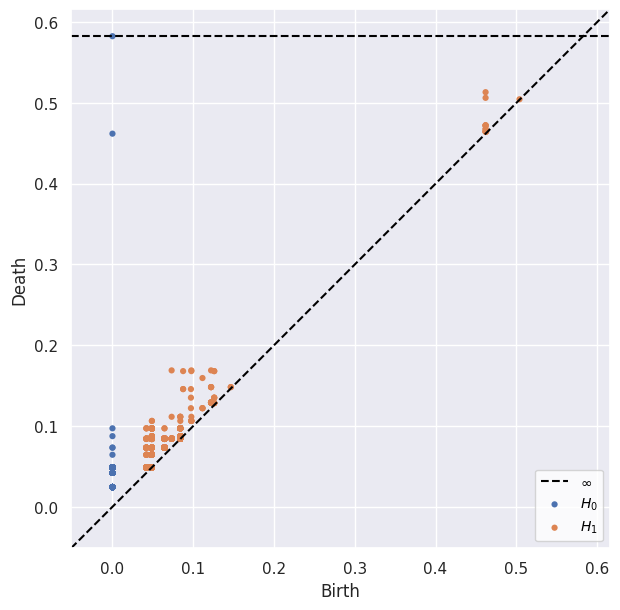

In [258]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.15)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


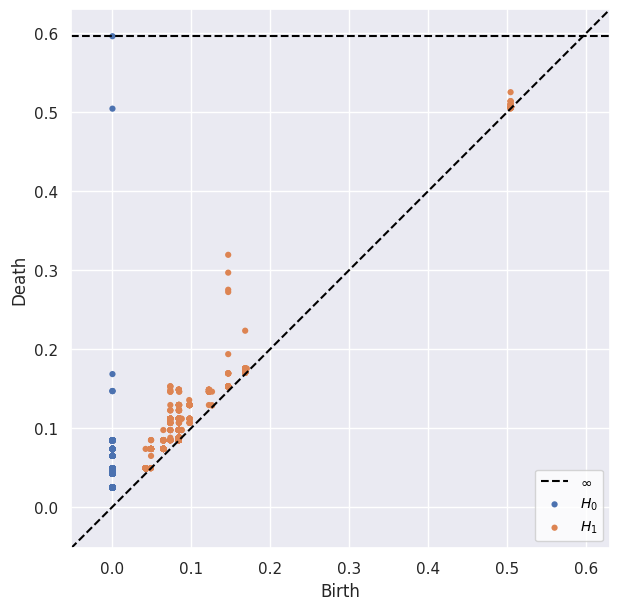

In [262]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


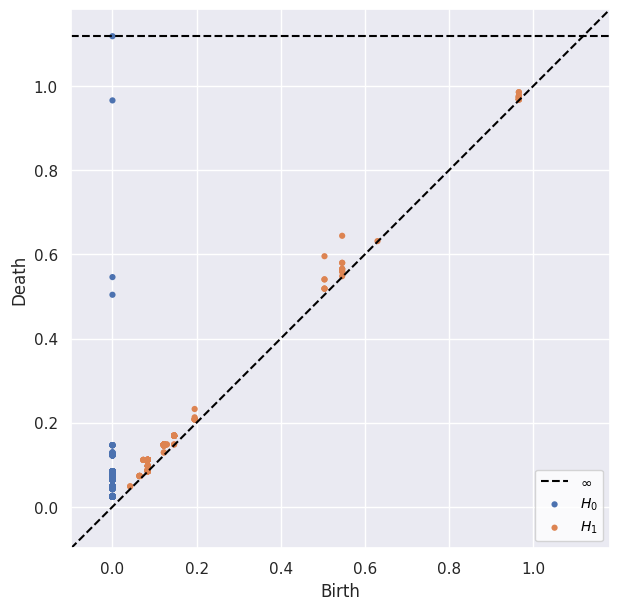

In [264]:
df_sup = SUP_SETS(0.2)
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

Pressure vs Rel Humidity

Pressure vs Relative Humidity shows relatively consistent KDE plots with around 3 clusters across weeks as indicated by the persistent diagrams. Week 4 and Week 5 see a larger clustering of similar values, different from that of Week 1,2 and 3 where we still have the same number of clusters but at different values

-1.3364828066845098 1.7935045502133369 -2.969607274756278 1.2872748336183801


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

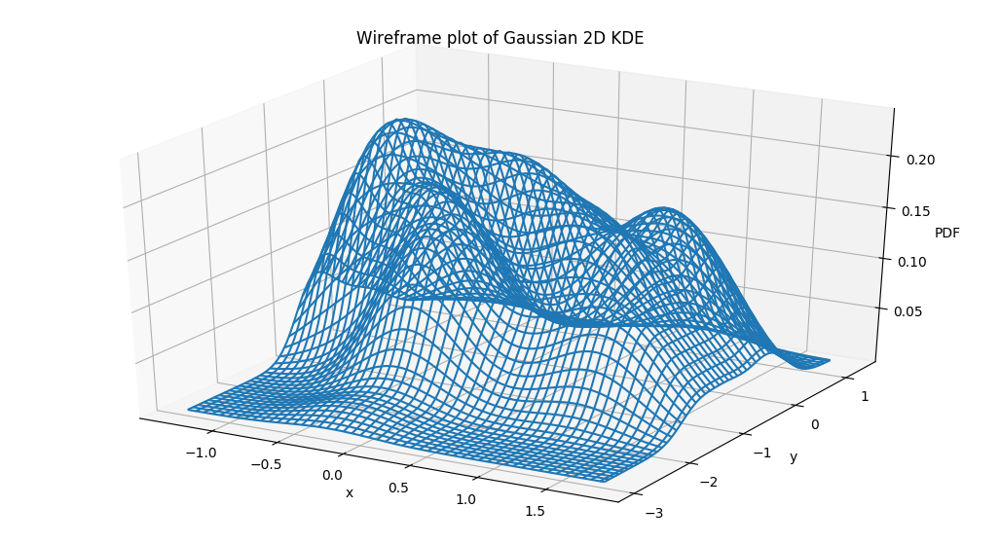

In [265]:
x = scaled_data[scaled_data['WEEK']=='1']['Stn Press (kPa)']
y = scaled_data[scaled_data['WEEK']=='1']['Rel Hum (%)']

#x = scaled_data['Temp (°C)']
#y = scaled_data['Stn Press (kPa)']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

X=[]
Y=[]

df_sup = pd.DataFrame()
def SUP_SETS(e):
 
  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)

In [0]:
df_sup = SUP_SETS(0.075)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


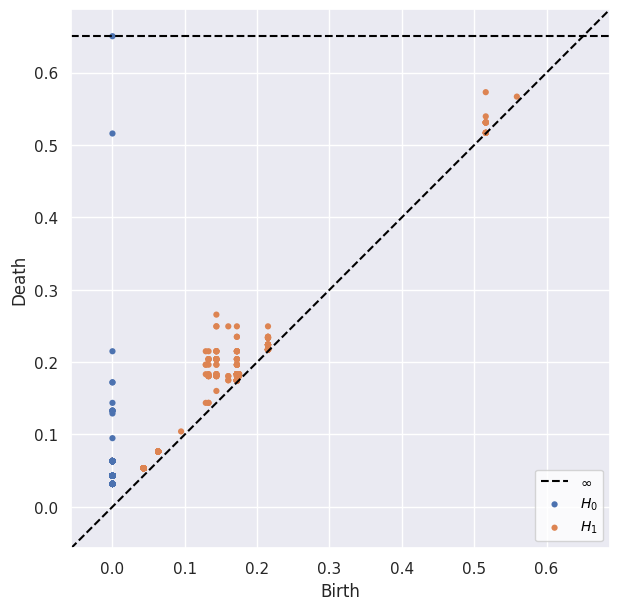

In [268]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.125)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


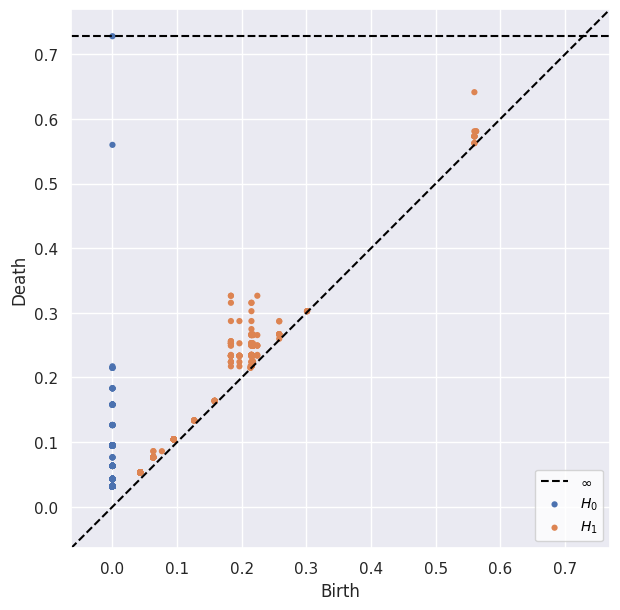

In [271]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.15)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


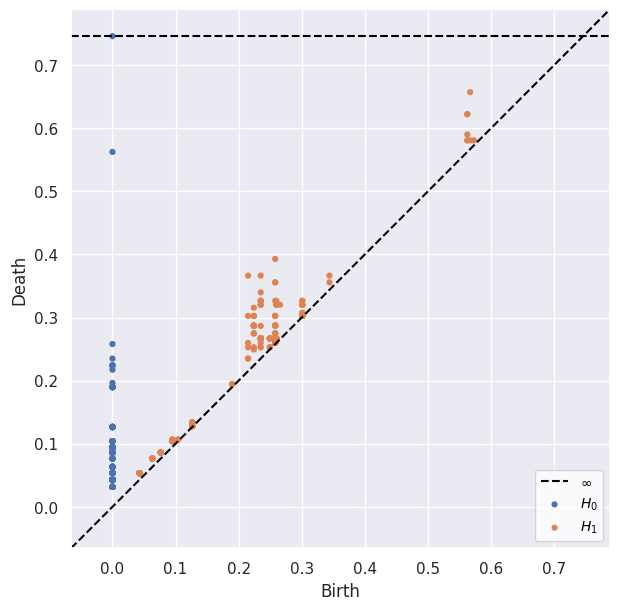

In [274]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.2)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


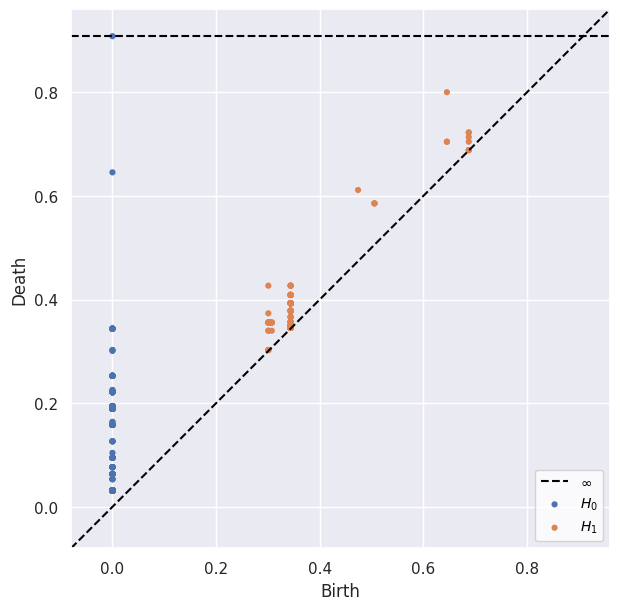

In [277]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

-2.4430091740459656 2.5208474272017094 -1.99613423446905 2.458742390574197


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

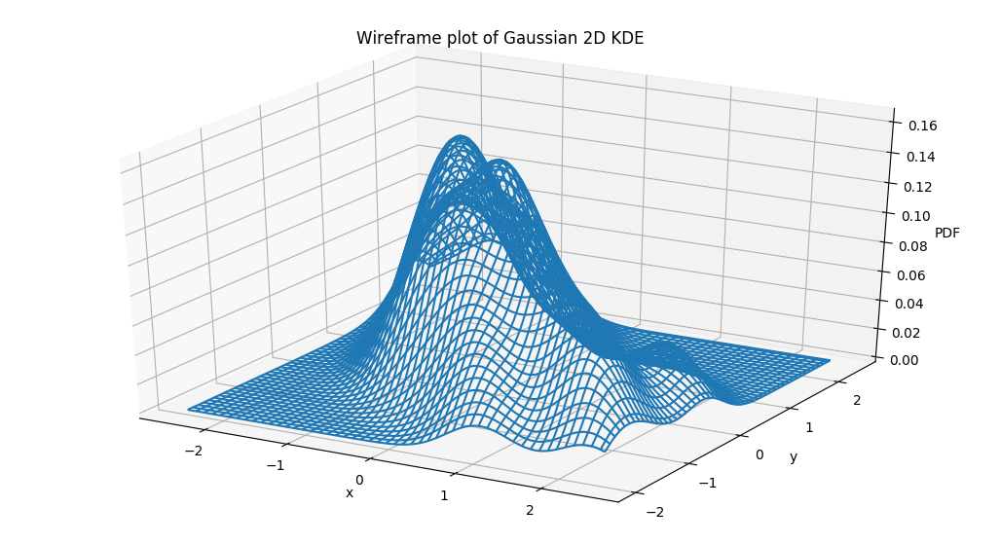

In [278]:
x = scaled_data[scaled_data['WEEK']=='2']['Stn Press (kPa)']
y = scaled_data[scaled_data['WEEK']=='2']['Rel Hum (%)']

#x = scaled_data['Temp (°C)']
#y = scaled_data['Stn Press (kPa)']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

X=[]
Y=[]

df_sup = pd.DataFrame()

def SUP_SETS(e):
  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)

In [0]:
df_sup = SUP_SETS(0.04)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


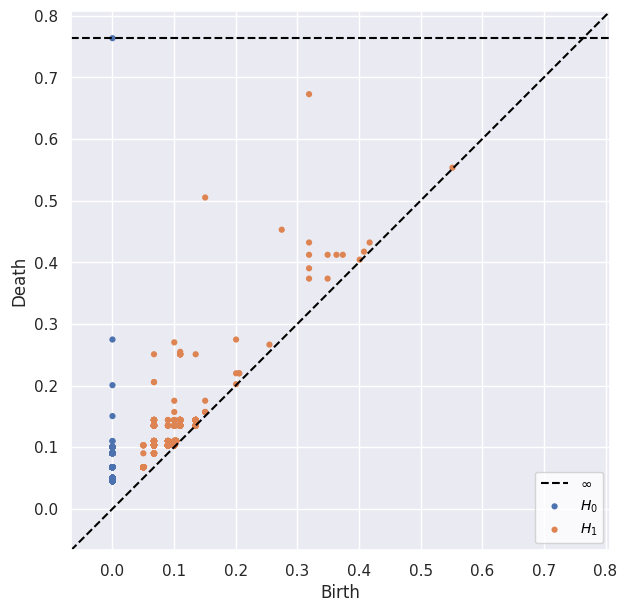

In [282]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.08)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


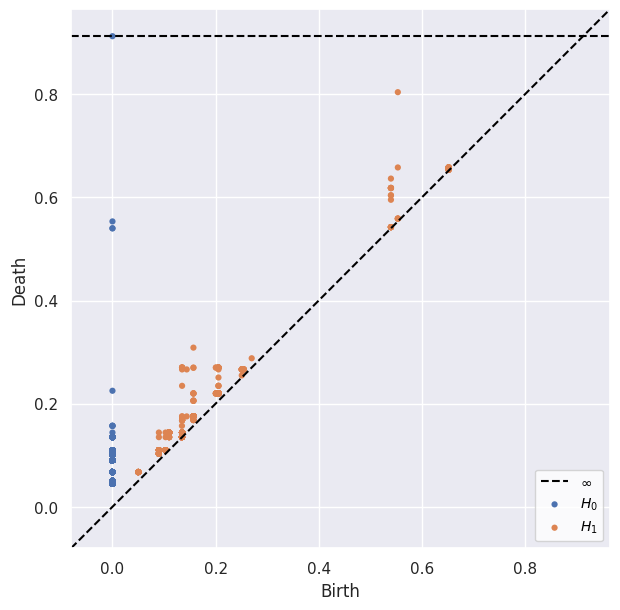

In [285]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.12)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


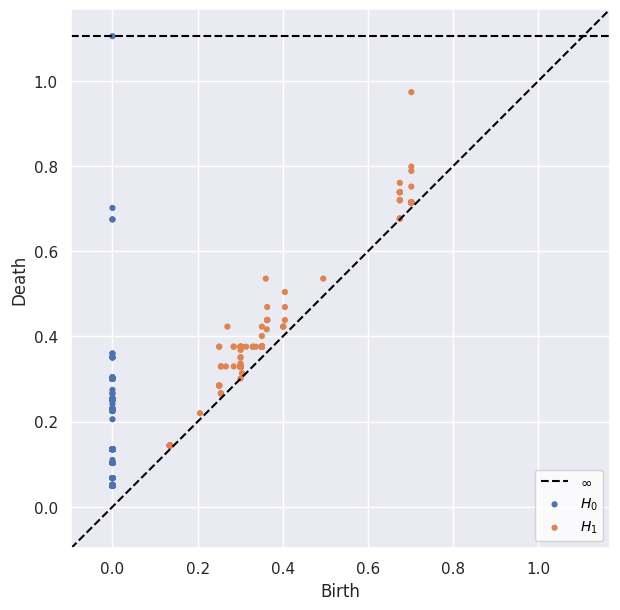

In [288]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

-2.258013592379084 2.278399801538909 -1.8971369761347554 2.359745132239903


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

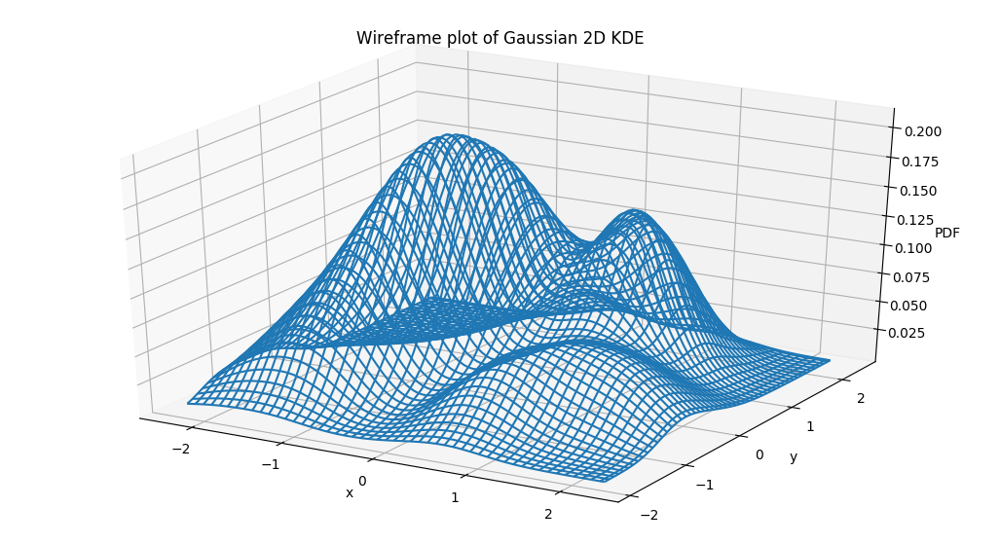

In [289]:
x = scaled_data[scaled_data['WEEK']=='3']['Stn Press (kPa)']
y = scaled_data[scaled_data['WEEK']=='3']['Rel Hum (%)']

#x = scaled_data['Temp (°C)']
#y = scaled_data['Stn Press (kPa)']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

X=[]
Y=[]

df_sup = pd.DataFrame()

def SUP_SETS(e):
  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)

In [0]:
df_sup = SUP_SETS(0.05)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


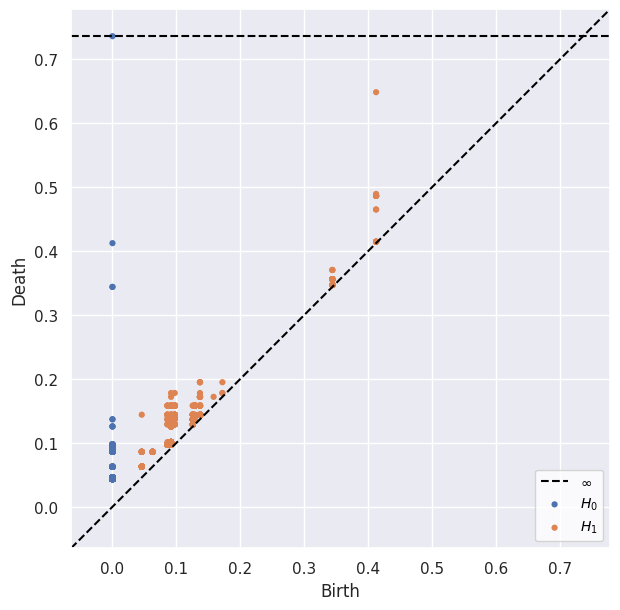

In [292]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.1)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


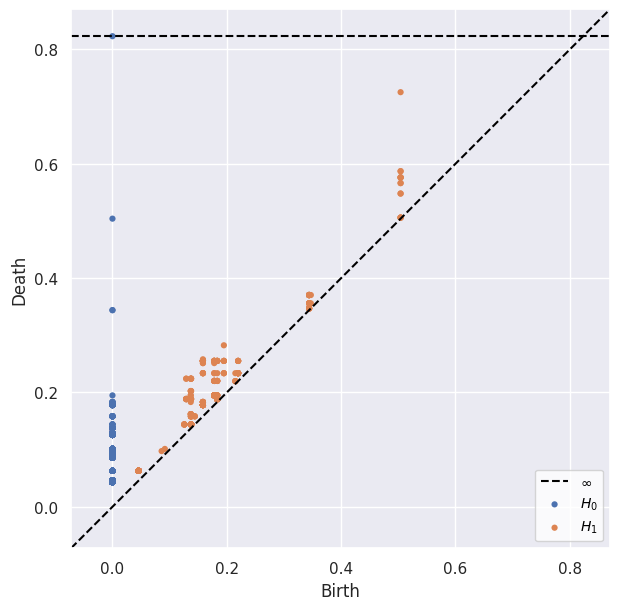

In [296]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.15)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


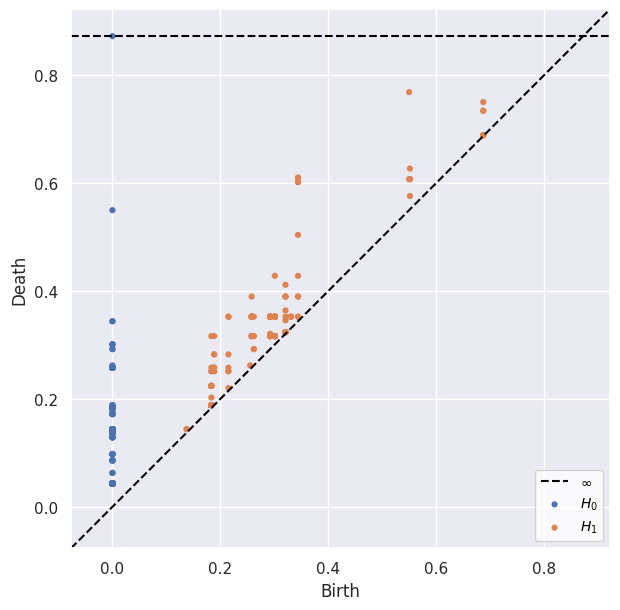

In [299]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

-2.9727170196883654 1.8670431665281135 -2.4663712115569485 2.6814862218263595


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

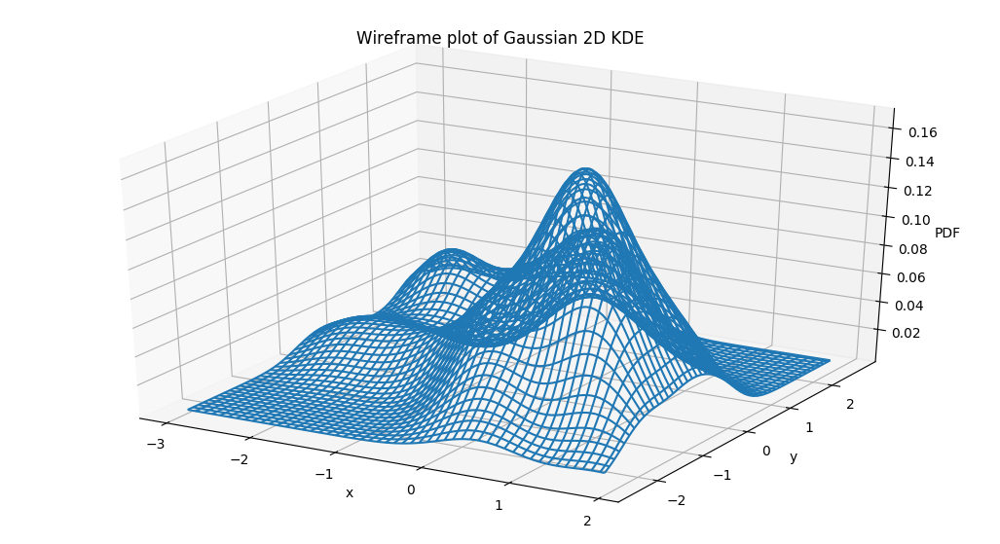

In [300]:
x = scaled_data[scaled_data['WEEK']=='4']['Stn Press (kPa)']
y = scaled_data[scaled_data['WEEK']=='4']['Rel Hum (%)']

#x = scaled_data['Temp (°C)']
#y = scaled_data['Stn Press (kPa)']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

X=[]
Y=[]

df_sup = pd.DataFrame()

def SUP_SETS(e):
  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)

In [0]:
df_sup = SUP_SETS(0.04)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


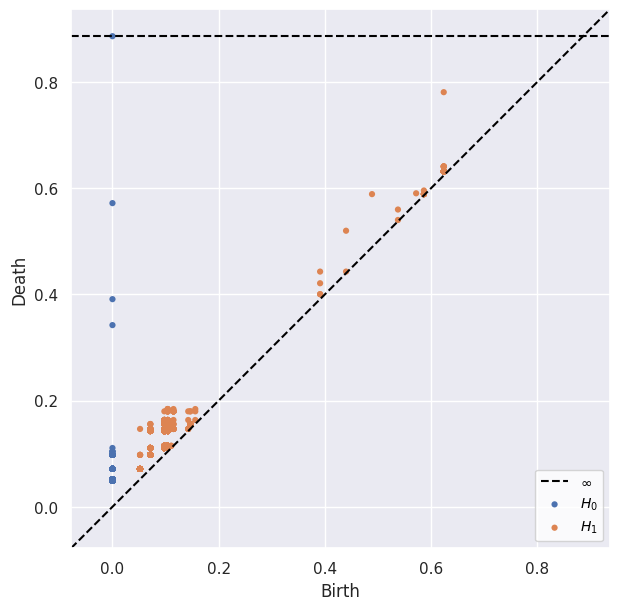

In [303]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.08)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


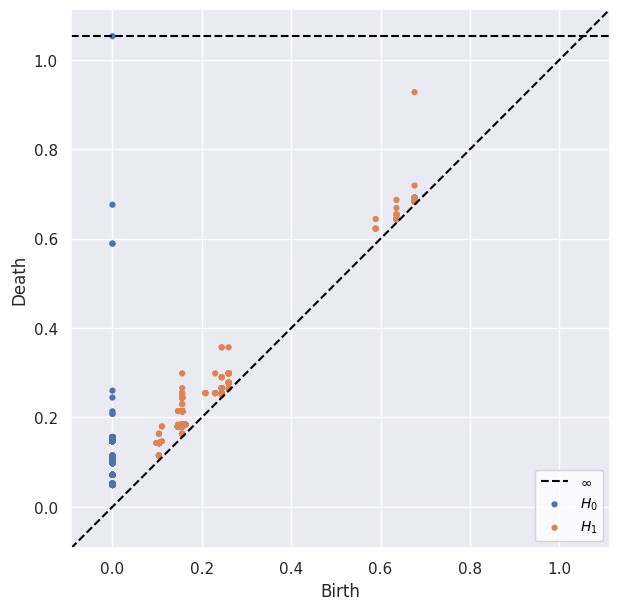

In [306]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.12)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


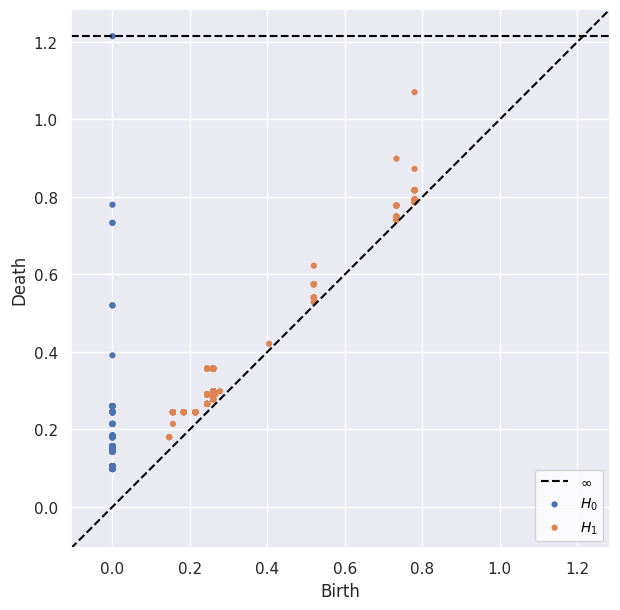

In [309]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

-2.0695708880724744 1.0328394877073155 -2.1363803504426335 2.02150449959773


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

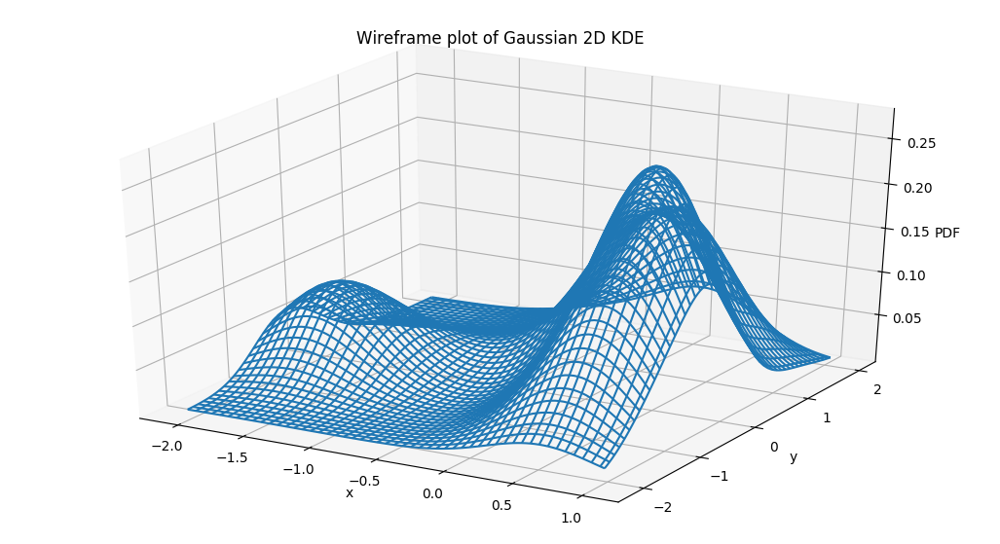

In [311]:
x = scaled_data[scaled_data['WEEK']=='5']['Stn Press (kPa)']
y = scaled_data[scaled_data['WEEK']=='5']['Rel Hum (%)']

#x = scaled_data['Temp (°C)']
#y = scaled_data['Stn Press (kPa)']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

X=[]
Y=[]

df_sup = pd.DataFrame()

def SUP_SETS(e):
  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)

In [0]:
df_sup = SUP_SETS(0.1)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


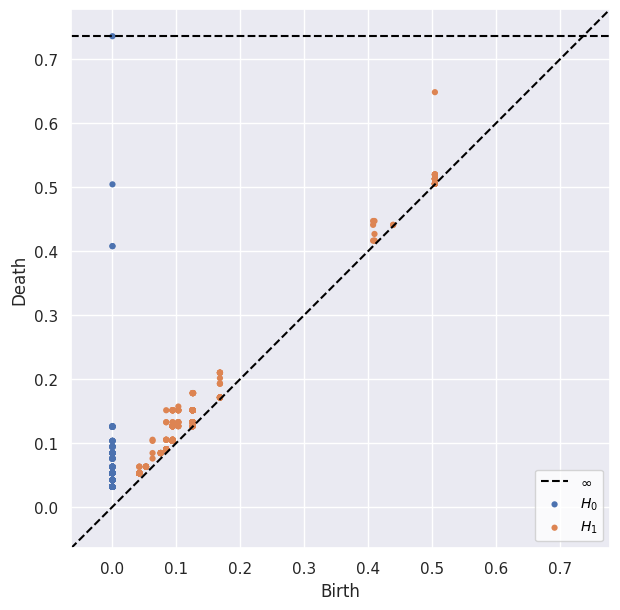

In [314]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.125)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


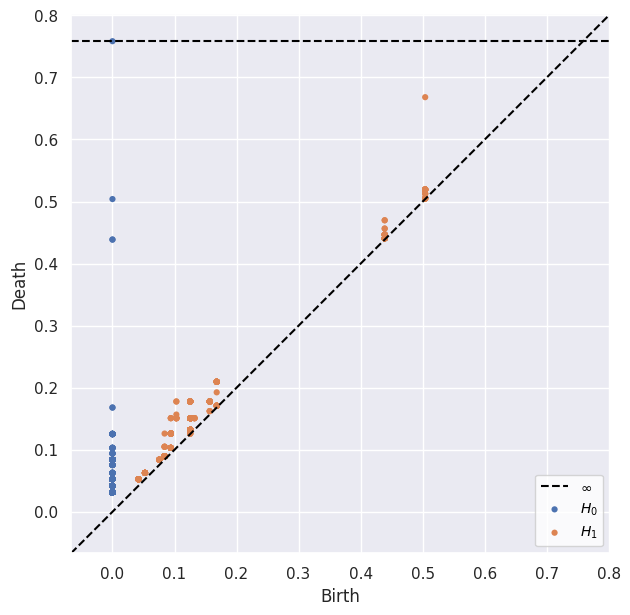

In [317]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.15)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


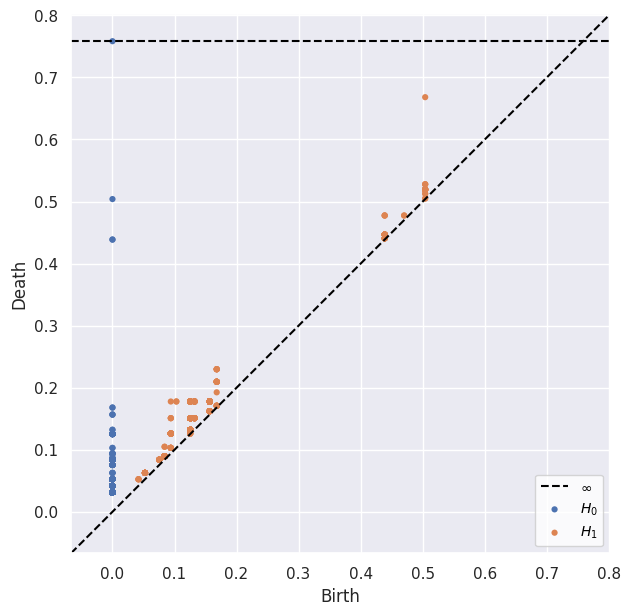

In [320]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

Summary : We can make some level of educated guess about temperature-pressure and pressure-real humidity based on past weeks patterns. However we cannot see any patterns in the shift based on the evaluation of temperature and real humidity .

**Problem** 2



In [0]:
df = pd.read_csv(r'price_comparison.csv', header=None)
df = df.rename(columns={0: 'CX', 1: 'CY'})

In [0]:
scaled_df = df
col = ['CX','CY']
scaled_df=pd.DataFrame(scaler.fit_transform(scaled_df),columns = col,index =df.index )


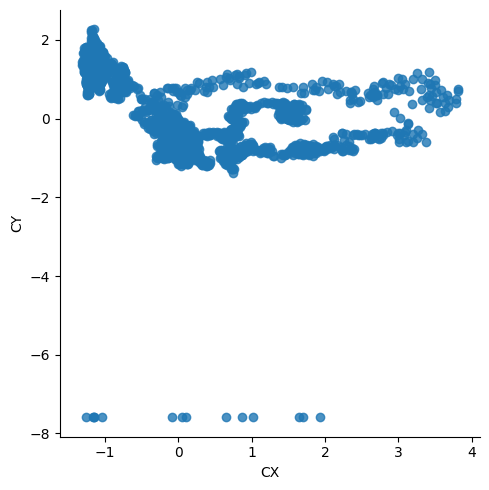

In [333]:
sns.lmplot('CX', 'CY', data=scaled_df,  fit_reg=False)


Computing KDE to estimate the distribution. The KDE estimator is then plotted to understand the distribution of data points and clusters. We then plot the Persistance diagrams for various values of KDE density function to check for clusters around values of Currency X and Y

-2.9920000000000018 128.43200000000002 -0.14578 1.60358


Text(0.5, 0.92, 'Wireframe plot of Gaussian 2D KDE')

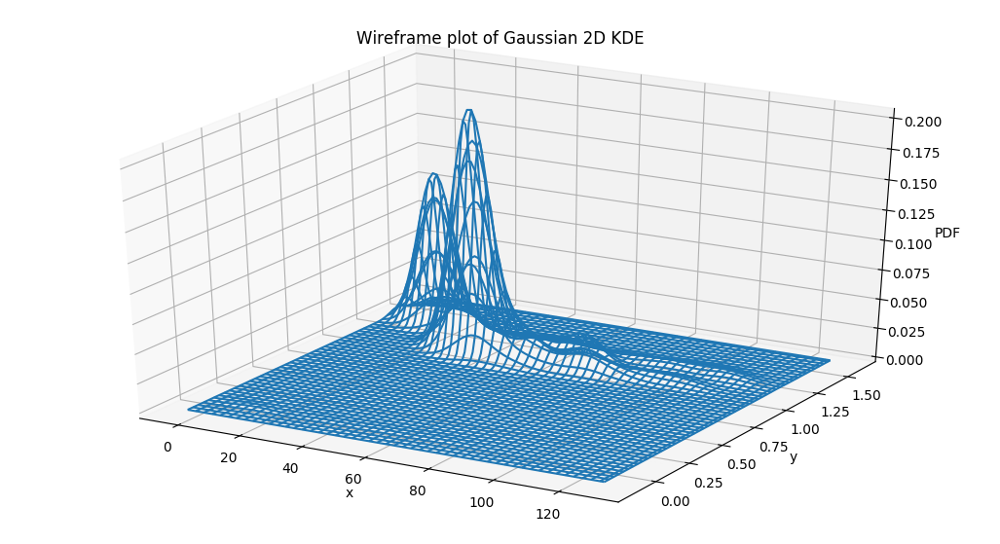

In [65]:
x = df['CX']
y = df['CY']

deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY
print(xmin, xmax, ymin, ymax)



xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = stats.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)




fig = plt.figure(figsize=(13, 7))
ax = plt.axes(projection='3d')
w = ax.plot_wireframe(xx, yy, f)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
ax.set_title('Wireframe plot of Gaussian 2D KDE')

There are two major peaks for the pdf and one minor peak - we can expect three clusters. Now the smaller peak indicates that this cluster will only be seen for a lower super level set(corresponding to the value 'e' below) and should disappear for higher values of e.

In [0]:
len(positions[1])

10000

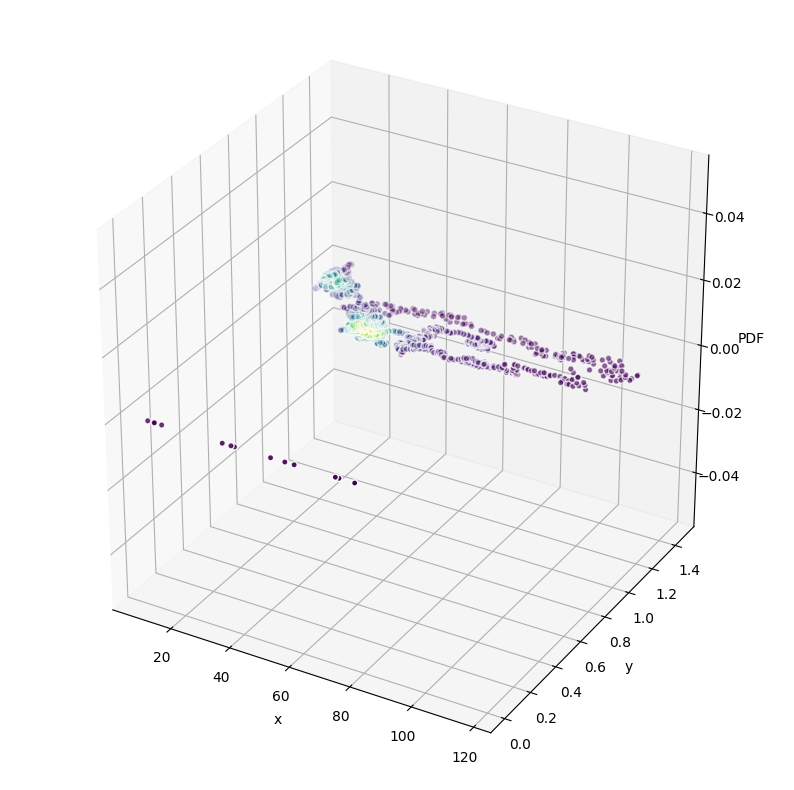

In [66]:
kde = stats.gaussian_kde(values)

density = kde(values)
fig, ax = plt.subplots(subplot_kw=dict(projection='3d'),figsize=(10,10))
x, y = values
ax.scatter(x, y, c=density,edgecolors='w')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('PDF')
plt.show()

In [0]:
i = list(set(positions[0]))
j = list(set(positions[1]))

In [0]:
max_kde = max(kde(values))
min_kde = min(kde(values))

In [0]:
X=[]
Y=[]
df_sup = pd.DataFrame()
def SUP_SETS(e):
  for n in range(0,100):
    for m in range(0,100):
      if f[n,m]>=e:
               
        X.append(i[n])
        Y.append(j[m])
      

  df_sup['X'] = X
  df_sup['Y'] = Y

  return(df_sup)
  

In [0]:
df_sup = SUP_SETS(0.025)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


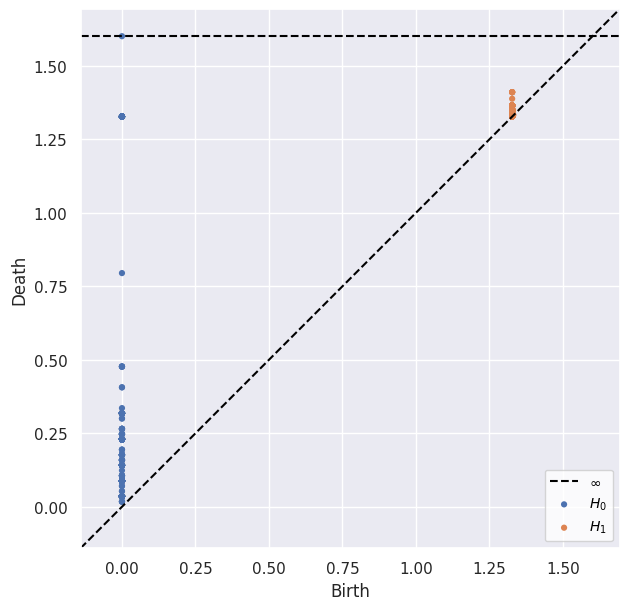

In [95]:
sns.set(color_codes=False)
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.05)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


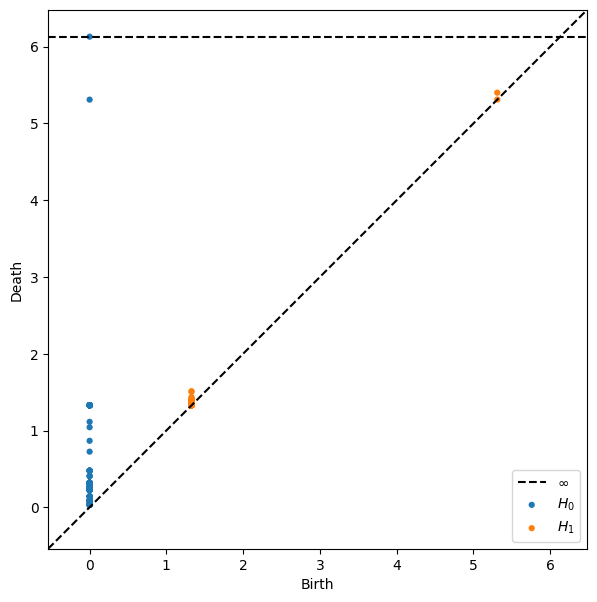

In [99]:
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.075)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


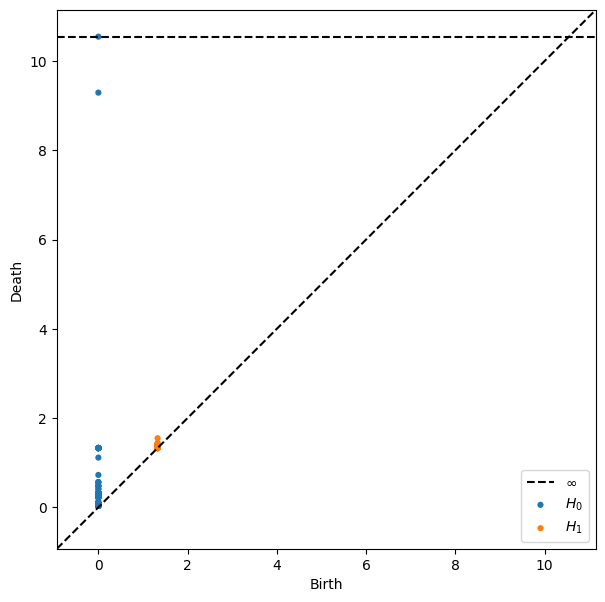

In [102]:
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.1)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


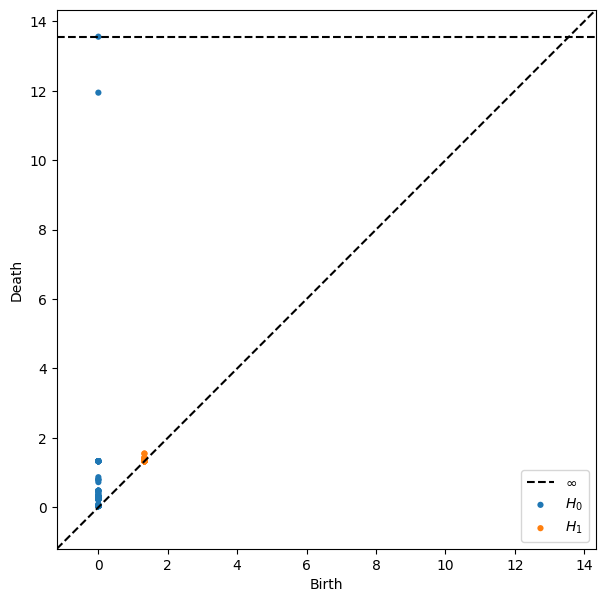

In [105]:
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.125)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


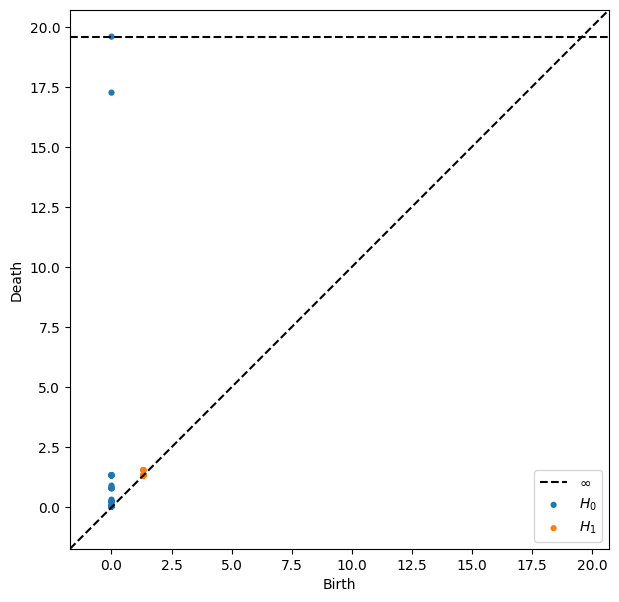

In [108]:
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.15)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


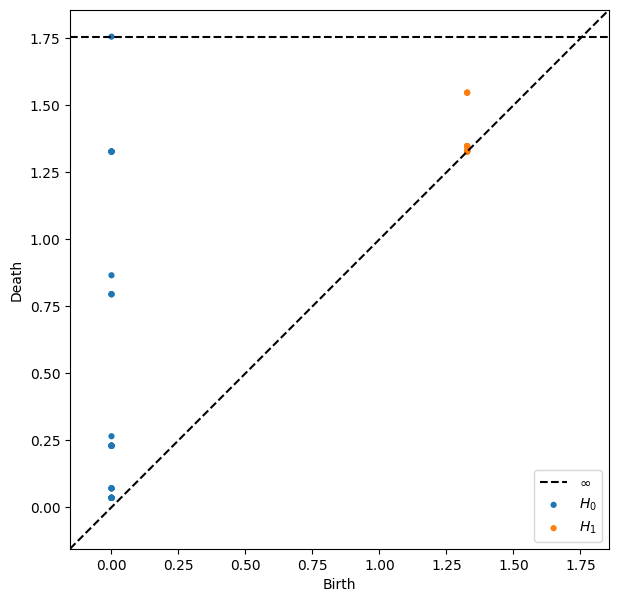

In [114]:
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

In [0]:
df_sup = SUP_SETS(0.2)

Rips(maxdim=1, thresh=inf, coeff=2, do_cocycles=False, n_perm = None, verbose=True)


/usr/local/lib/python3.6/dist-packages/ripser/ripser.py:216: UserWarning: The input matrix is square, but the distance_matrix flag is off.  Did you mean to indicate that this was a distance matrix?
  + "this was a distance matrix?"


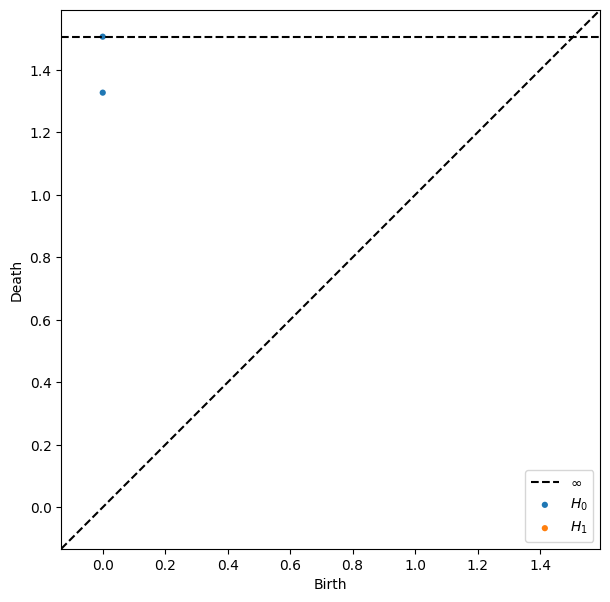

In [119]:
fig = plt.figure(figsize=(13, 7))
rips = Rips()
diagrams = rips.fit_transform(df_sup)
rips.plot(diagrams)

As indicated by the persistence diagrams, there are predominantly two major clusters and one smaller cluster which vanish for higher values of e( since kde is a pdf, this means that only relatively smaller number of points form this cluster). As indicated by the KDE plot the peaks appear around the smaller values of CX and higher values of CY - which indicates the standard exchange rates.